# About Walmart
Walmart is an American multinational retail corporation that operates a chain of supercenters, discount departmental stores, and grocery stores from the United States. Walmart has more than 100 million customers worldwide.

# Business Problem

- The Management team at Walmart Inc. wants to analyze the customer purchase behavior (specifically, purchase amount) against the customer’s gender and the various other factors to help the business make better decisions.
- They want to understand if the spending habits differ between male and female customers: Do women spend more on Black Friday than men? (Assume 50 million customers are male and 50 million are female).

# Data Description
- User_ID -	User ID
- Product_ID - Product ID
- Gender - Sex of User
- Age - Age in bins
- Occupation - Occupation(Masked)
- City_Category -	Category of the City (A,B,C)
- StayInCurrentCityYears - Number of years stay in current city
- Marital_Status - Marital Status
- ProductCategory -	Product Category (Masked)
- Purchase -Purchase Amount

In [4]:
import math
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tabulate import tabulate as tb
from scipy import stats

In [5]:
from google.colab import userdata
data_url = userdata.get('walmart_url')

In [6]:
data = pd.read_csv(data_url)

In [7]:
data.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,7969


In [8]:
rows, columns = data.shape
print(f"Number of Rows: {rows}\nNumber of columns: {columns}")

Number of Rows: 550068
Number of columns: 10


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   User_ID                     550068 non-null  int64 
 1   Product_ID                  550068 non-null  object
 2   Gender                      550068 non-null  object
 3   Age                         550068 non-null  object
 4   Occupation                  550068 non-null  int64 
 5   City_Category               550068 non-null  object
 6   Stay_In_Current_City_Years  550068 non-null  object
 7   Marital_Status              550068 non-null  int64 
 8   Product_Category            550068 non-null  int64 
 9   Purchase                    550068 non-null  int64 
dtypes: int64(5), object(5)
memory usage: 42.0+ MB


In [10]:
pd.DataFrame(data.isnull().sum(axis = 0), columns = ["Null Value Count"])

,Null Value Count
User_ID,0
Product_ID,0
Gender,0
Age,0
Occupation,0
City_Category,0
Stay_In_Current_City_Years,0
Marital_Status,0
Product_Category,0
Purchase,0


- There are no NULL values present in the Data

In [11]:
data['Marital_Status'].unique()

array([0, 1])

In [12]:
# converting Marital_Status into categories

mar_st = {0: "Single", 1: "Married"}
data['Marital_Status'] = data['Marital_Status'].replace(mar_st)
data.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
0,1000001,P00069042,F,0-17,10,A,2,Single,3,8370
1,1000001,P00248942,F,0-17,10,A,2,Single,1,15200
2,1000001,P00087842,F,0-17,10,A,2,Single,12,1422
3,1000001,P00085442,F,0-17,10,A,2,Single,12,1057
4,1000002,P00285442,M,55+,16,C,4+,Single,8,7969


In [13]:
data.dtypes

User_ID                        int64
Product_ID                    object
Gender                        object
Age                           object
Occupation                     int64
City_Category                 object
Stay_In_Current_City_Years    object
Marital_Status                object
Product_Category               int64
Purchase                       int64
dtype: object

In [14]:
data.describe()

,User_ID,Occupation,Product_Category,Purchase
count,5.500680e+05,550068.000000,550068.000000,550068.000000
mean,1.003029e+06,8.076707,5.404270,9263.968713
std,1.727592e+03,6.522660,3.936211,5023.065394
min,1.000001e+06,0.000000,1.000000,12.000000
25%,1.001516e+06,2.000000,1.000000,5823.000000
50%,1.003077e+06,7.000000,5.000000,8047.000000
75%,1.004478e+06,14.000000,8.000000,12054.000000
max,1.006040e+06,20.000000,20.000000,23961.000000


In [15]:
data['Product_Category'] = data['Product_Category'].astype('int8').astype('category')
data['Occupation'] = data['Occupation'].astype('int8').astype('category')
data['User_ID'] = data['User_ID'].astype('int16').astype('category')
data['Age'] = data['Age'].astype('category')
data['Marital_Status'] = data['Marital_Status'].astype('category')
data['Stay_In_Current_City_Years'] = data['Stay_In_Current_City_Years'].astype('category')
data['City_Category'] = data['City_Category'].astype('category')
data['Gender'] = data['Gender'].astype('category')
data['Product_ID'] = data['Product_ID'].astype('category')

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   User_ID                     550068 non-null  category
 1   Product_ID                  550068 non-null  category
 2   Gender                      550068 non-null  category
 3   Age                         550068 non-null  category
 4   Occupation                  550068 non-null  category
 5   City_Category               550068 non-null  category
 6   Stay_In_Current_City_Years  550068 non-null  category
 7   Marital_Status              550068 non-null  category
 8   Product_Category            550068 non-null  category
 9   Purchase                    550068 non-null  int64   
dtypes: category(9), int64(1)
memory usage: 10.2 MB


- Our data is mostly dominated by categorical columns
- Purchase happens to be the only continuous column

In [17]:
# observing the number of unique_values in each column

pd.DataFrame(data.nunique(), columns = ["Unique Value Count"])\
.sort_values(by = ["Unique Value Count"], ascending = False)

,Unique Value Count
Purchase,18105
User_ID,5891
Product_ID,3631
Occupation,21
Product_Category,20
Age,7
Stay_In_Current_City_Years,5
City_Category,3
Gender,2
Marital_Status,2


In [18]:
data.describe(include = ['category','object']).T

,count,unique,top,freq
User_ID,550068,5891,18640,1026
Product_ID,550068,3631,P00265242,1880
Gender,550068,2,M,414259
Age,550068,7,26-35,219587
Occupation,550068,21,4,72308
City_Category,550068,3,B,231173
Stay_In_Current_City_Years,550068,5,1,193821
Marital_Status,550068,2,Single,324731
Product_Category,550068,20,5,150933


In [19]:
data.describe()

,Purchase
count,550068.000000
mean,9263.968713
std,5023.065394
min,12.000000
25%,5823.000000
50%,8047.000000
75%,12054.000000
max,23961.000000


- There are **5891 unique customers** who made atleast 1 purchase
- User with user ID 18640 is making the highest number of purchases i.e.1026 purchases
- There are **21 different occupations** to which the user belongs to with occupation **category 4 having the maximum number of users**
- There are **7 different age-groups**
- Most of the customeres below to age group **26-35** signifying that customers making the **maximum number of purchases are made by young people**
- There are 3 different city categories with **city category B with maximum nuber of purchases**.
- There are **3631 different unique products** belonging to **20 different product categories**
- There are 2 genders with **males making the greater number of purchases**
- Purchase amount is varying from 12 - 23961 with almost **50% of purchases made between 5823 and 12054**


### Checking value counts for unique categories

In [20]:
def proportions(col:str,
                df:pd.DataFrame = data):
  '''Given a dataframe along with the column name generates the proportion and
     cummulative_proportion for the categories'''

  temp = (data[col].value_counts(normalize = True) * 100).to_frame()
  temp['cummulative_proportion'] = (data[col].value_counts(normalize = True) * 100).cumsum()
  return temp

def generate_pie(df:pd.DataFrame,
                 col:str):
  pass

In [21]:
proportions('Gender')

,proportion,cummulative_proportion
Gender,,
M,75.310507,75.310507
F,24.689493,100.000000


- Nearly **3 out of 4 transactions** are made by males

In [22]:
proportions('Age')

,proportion,cummulative_proportion
Age,,
26-35,39.919974,39.919974
36-45,19.999891,59.919864
18-25,18.117760,78.037624
46-50,8.308246,86.345870
51-55,6.999316,93.345186
55+,3.909335,97.254521
0-17,2.745479,100.000000


- Nearly 78% customers are from 18-35 years of age with ~40% transactions made by people from 26-35 years of age

In [23]:
proportions('Occupation')

,proportion,cummulative_proportion
Occupation,,
4,13.145284,13.145284
0,12.659889,25.805173
7,10.750125,36.555299
1,8.621843,45.177142
17,7.279645,52.456787
20,6.101427,58.558215
12,5.668208,64.226423
14,4.964659,69.191082
2,4.833584,74.024666


- ~82% of the purchases are made by user belonging to the below occupation categories:
  - 4, 0, 7, 1, 17, 20, 12, 14, 2, 16, 6


In [24]:
proportions('Stay_In_Current_City_Years')

,proportion,cummulative_proportion
Stay_In_Current_City_Years,,
1,35.235825,35.235825
2,18.513711,53.749536
3,17.322404,71.071940
4+,15.402823,86.474763
0,13.525237,100.000000


- Majority of the transactions (53.75 % of total transactions) are made by the customers having 1 or 2 years of stay in the current city


In [25]:
proportions('City_Category')

,proportion,cummulative_proportion
City_Category,,
B,42.026259,42.026259
C,31.118880,73.145138
A,26.854862,100.000000


In [26]:
proportions('Marital_Status')

,proportion,cummulative_proportion
Marital_Status,,
Single,59.034701,59.034701
Married,40.965299,100.000000


In [27]:
proportions('Product_Category')

,proportion,cummulative_proportion
Product_Category,,
5,27.438971,27.438971
1,25.520118,52.959089
8,20.711076,73.670164
11,4.415272,78.085437
2,4.338373,82.423809
6,3.720631,86.144440
3,3.674637,89.819077
4,2.136645,91.955722
16,1.786688,93.742410


- 82.42% of total transactions are coming from the below product categories:
  - 5, 1, 8, 11, 2

In [151]:
# percentace of unique users per category

data.groupby(['Age'])['User_ID'].nunique().to_frame()


,User_ID
Age,
0-17,218
18-25,1069
26-35,2053
36-45,1167
46-50,531
51-55,481
55+,372


In [158]:
def unique_users_percentage(col:str, df:pd.DataFrame = data):
  '''Gives the revenue generated by each category for the column'''

  # finding the sum of purchases for each category in the column
  temp = df.groupby(col)['User_ID'].nunique().to_frame()
  total_unique_users = df['User_ID'].nunique()

  # finding the total purchase amount
  temp = ((temp['User_ID']/total_unique_users)*100).to_frame()
  temp.columns = ['Unique Users %']
  temp = temp.sort_values(by = 'Unique Users %', ascending = False)

  temp['cummulative_unique_users%'] = temp['Unique Users %'].cumsum()
  return temp

def generate_unique_users_category(col: str, df:pd.DataFrame = data, kind = ['pie','bar']):
  '''Generates a barplot and/or piechart showing the revenue percentage of each category'''

  plt.figure(figsize=(10,6))
  plt.style.use('ggplot')
  temp = revenue_generated_percentage(col = col, df = df)
  # barplot
  plt.title(f'Percentage of unique users for {col}',
            fontsize = 16,
            fontweight = 600,
            fontstyle = 'oblique',
            fontfamily = 'serif')

  if 'bar' in kind:
    sns.barplot(temp.iloc[:,0])
    plt.show()

  # piechart
  if 'pie' in kind:
    plt.pie(x = temp['Unique Users %'],
         labels = temp.index,
         autopct = '%.2f%%',
         textprops = {'fontsize' : 14,
                     'fontstyle' : 'oblique',
                     'fontfamily' : 'serif',
                     'fontweight' : 500})
    plt.show()

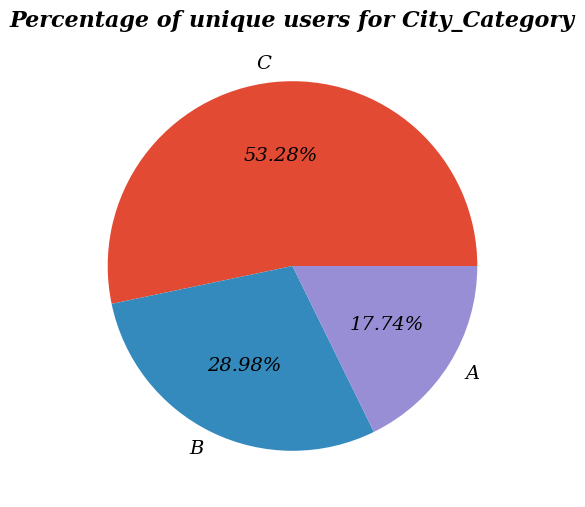

In [160]:
generate_unique_users_category('City_Category', kind = ['pie'])

- Majority of Unique users are from city C

In [168]:
unique_users_percentage('Age')

,Unique Users %,cummulative_unique_users%
Age,,
26-35,34.849771,34.849771
36-45,19.809879,54.659650
18-25,18.146325,72.805975
46-50,9.013750,81.819725
51-55,8.164997,89.984722
55+,6.314717,96.299440
0-17,3.700560,100.000000


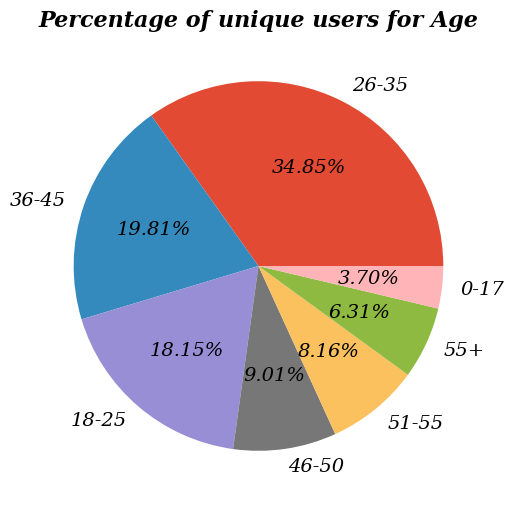

In [166]:
generate_unique_users_category('Age', kind = ['pie'])

In [169]:
unique_users_percentage('Stay_In_Current_City_Years')

,Unique Users %,cummulative_unique_users%
Stay_In_Current_City_Years,,
1,35.409947,35.409947
2,19.436428,54.846376
3,16.618571,71.464947
4+,15.430317,86.895264
0,13.104736,100.000000


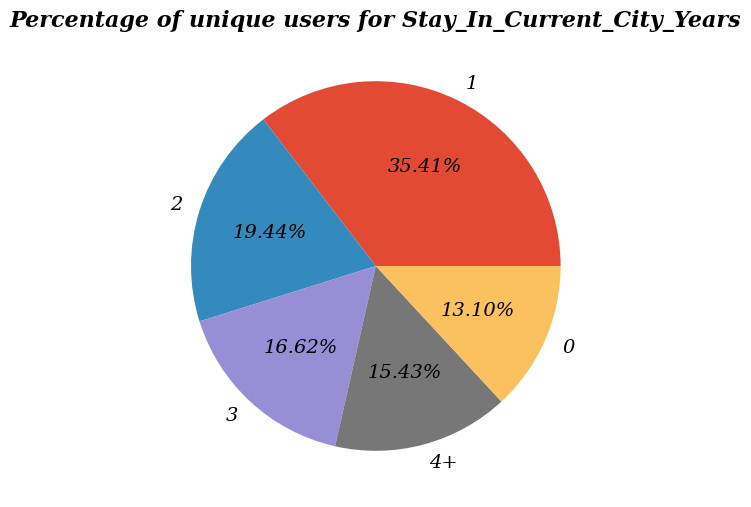

In [167]:
generate_unique_users_category('Stay_In_Current_City_Years', kind = ['pie'])

- ~55% unique users have been staying in current city for <=2 years

In [28]:
# Revenue generated by Walmart from each Gender

def revenue_generated_percentage(col:str, df:pd.DataFrame = data):
  '''Gives the revenue generated by each category for the column'''

  # finding the sum of purchases for each category in the column
  temp = df.groupby(col)['Purchase'].sum().to_frame()
  total_purchase = df['Purchase'].sum()

  # finding the total purchase amount
  temp = ((temp['Purchase']/total_purchase)*100).to_frame()
  temp.columns = ['Revenue %']
  temp = temp.sort_values(by = 'Revenue %', ascending = False)

  temp['cummulative_revenue%'] = temp['Revenue %'].cumsum()
  return temp

def generate_revenue_per_category(col: str, df:pd.DataFrame = data, kind = ['pie','bar']):
  '''Generates a barplot and/or piechart showing the revenue percentage of each category'''

  plt.figure(figsize=(10,6))
  plt.style.use('ggplot')
  temp = revenue_generated_percentage(col = col, df = df)
  # barplot
  plt.title(f'Percentage of revenue generated per category for {col}',
            fontsize = 16,
            fontweight = 600,
            fontstyle = 'oblique',
            fontfamily = 'serif')

  if 'bar' in kind:
    sns.barplot(temp.iloc[:,0])
    plt.show()

  # piechart
  if 'pie' in kind:
    plt.pie(x = temp['Revenue %'],
         labels = temp.index,
         autopct = '%.2f%%',
         textprops = {'fontsize' : 14,
                     'fontstyle' : 'oblique',
                     'fontfamily' : 'serif',
                     'fontweight' : 500})
    plt.show()

In [29]:
revenue_generated_percentage('Gender')

,Revenue %,cummulative_revenue%
Gender,,
M,76.721424,76.721424
F,23.278576,100.000000


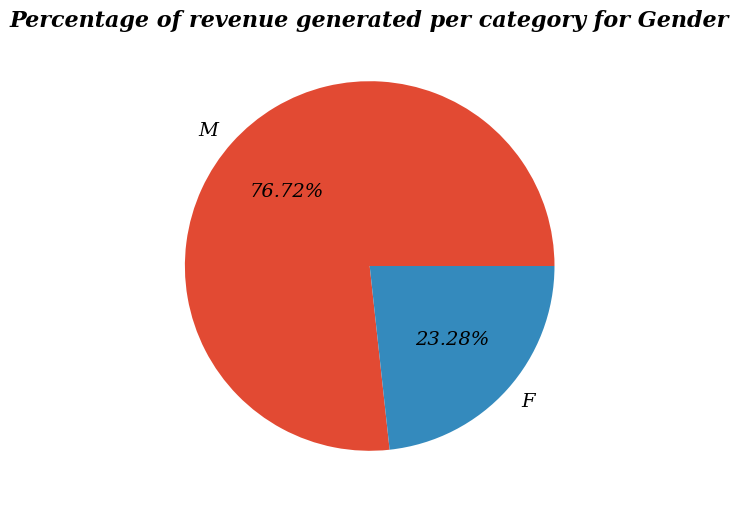

In [30]:
generate_revenue_per_category('Gender', kind = ['pie'])

- Majority of revenue is coming from Males
- ~77% revenue is generated from males and ~23% from females

In [31]:
revenue_generated_percentage('Product_Category')


,Revenue %,cummulative_revenue%
Product_Category,,
1,37.482024,37.482024
5,18.482532,55.964556
8,16.765114,72.729670
6,6.361111,79.090781
2,5.269350,84.360130
3,4.004949,88.365080
16,2.847840,91.212920
11,2.233032,93.445952
10,1.978827,95.424778


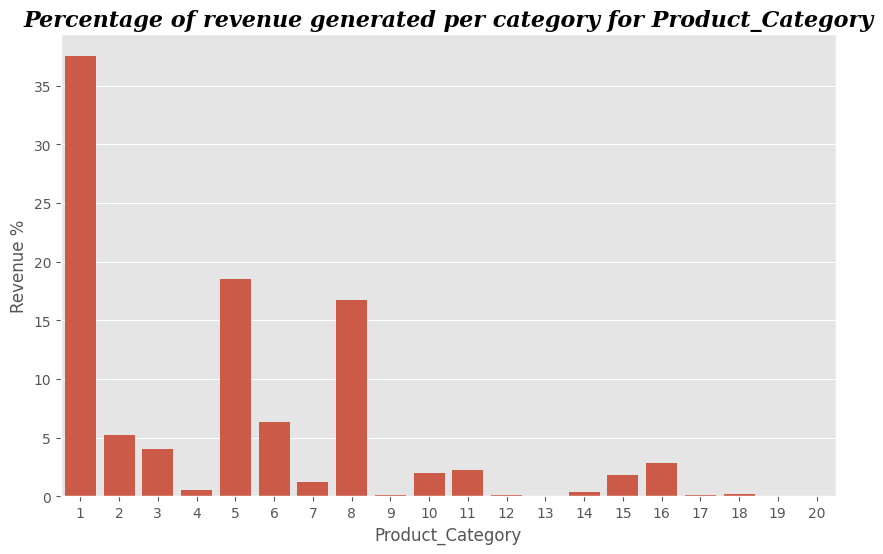

In [32]:
generate_revenue_per_category('Product_Category', kind = ['bar'])

We see that though 82.42% of total transactions are coming from the below product categories:
  - 5, 1, 8, 11, 2

But nearly 80% of revenue is generateed from categories
  - 1, 5, 8 and 6
  

In [33]:
revenue_generated_percentage('City_Category')

,Revenue %,cummulative_revenue%
City_Category,,
B,41.515136,41.515136
C,32.650483,74.165619
A,25.834381,100.000000


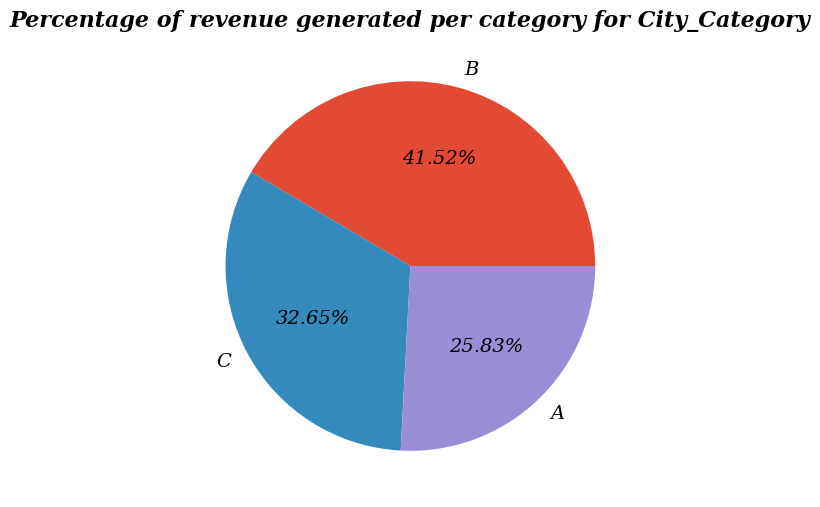

In [34]:
generate_revenue_per_category('City_Category', kind = ['pie'])

- City category B leads with a share of ~42% of revenue

In [35]:
revenue_generated_percentage('Age')

,Revenue %,cummulative_revenue%
Age,,
26-35,39.871374,39.871374
36-45,20.145361,60.016736
18-25,17.933325,77.950061
46-50,8.258612,86.208673
51-55,7.203947,93.412620
55+,3.939850,97.352470
0-17,2.647530,100.000000


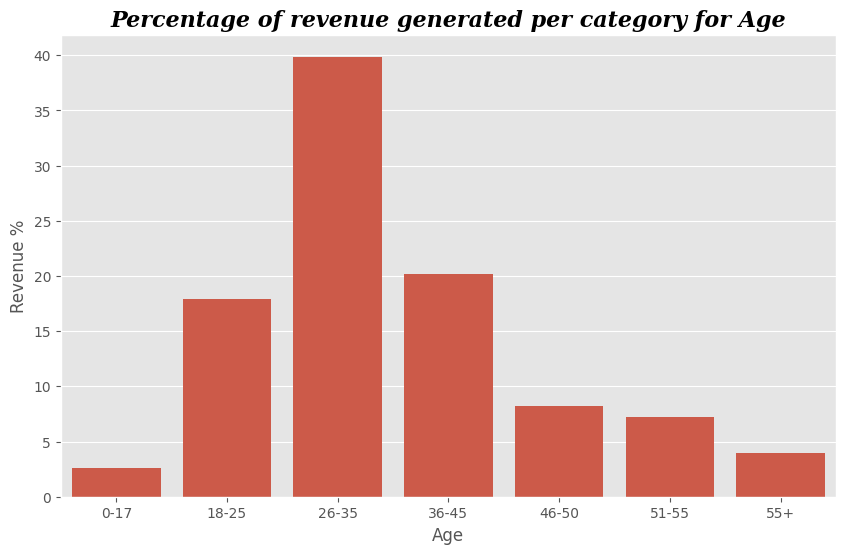

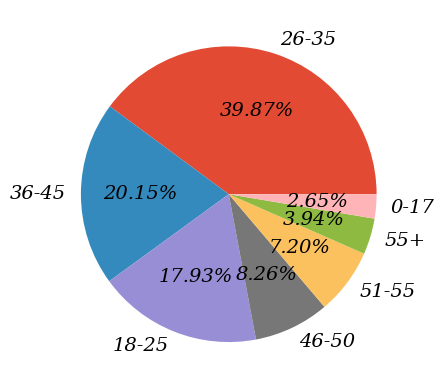

In [36]:
generate_revenue_per_category('Age')

- Proportional to the proportion of transactions we see that even the revenue share of nearly 78% comes from age group 18-35 with age group 26-35 contributing nearly 40%

In [37]:
revenue_generated_percentage('Marital_Status')

,Revenue %,cummulative_revenue%
Marital_Status,,
Single,59.047057,59.047057
Married,40.952943,100.000000


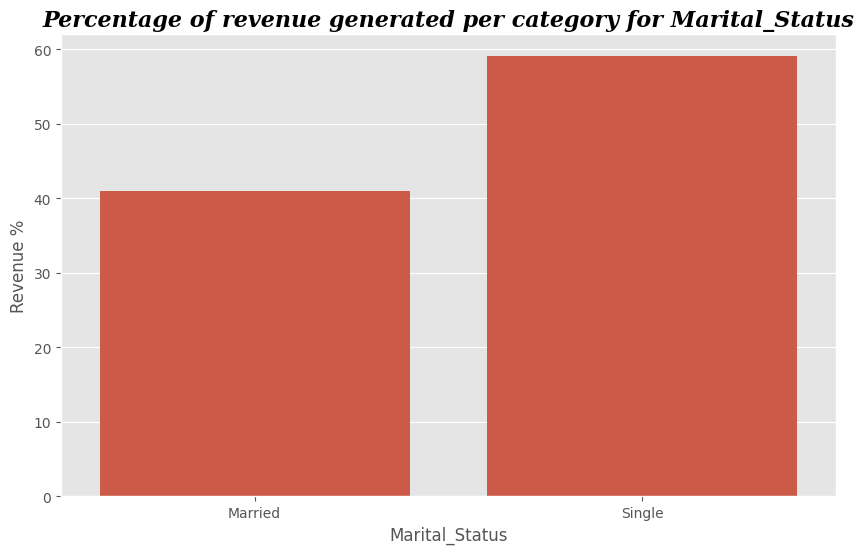

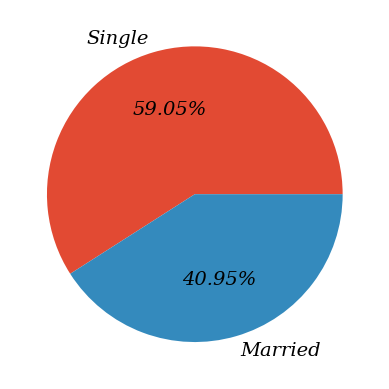

In [38]:
generate_revenue_per_category('Marital_Status')

- Here as well we see that proprotonial to the number of transactions, the revenue generated percentage of Single is about 59% and Married is nearly abour 41%

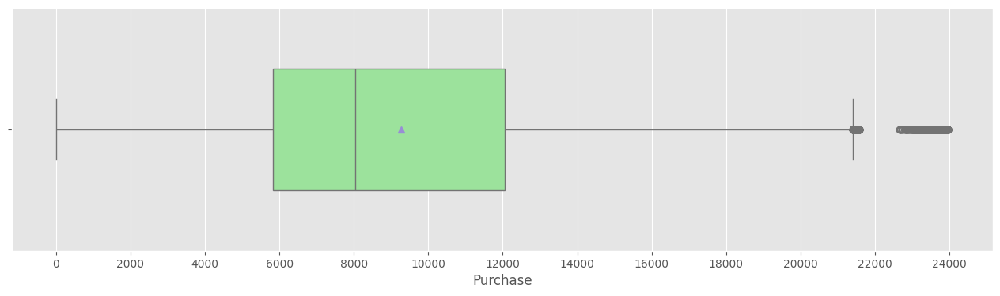

In [39]:
plt.figure(figsize = (16, 4))
sns.boxplot(data = data,
            x = 'Purchase',
            showmeans = True,
            width = 0.5,
            color = 'lightgreen')
plt.xticks(np.arange(0, 25001, 2000))
plt.show()

- We observe that 50% of the purchases made are between amount range 5900 - 12000
- Median purchase amount is at 8000
- We also observe some outliers at the higher end of the plot

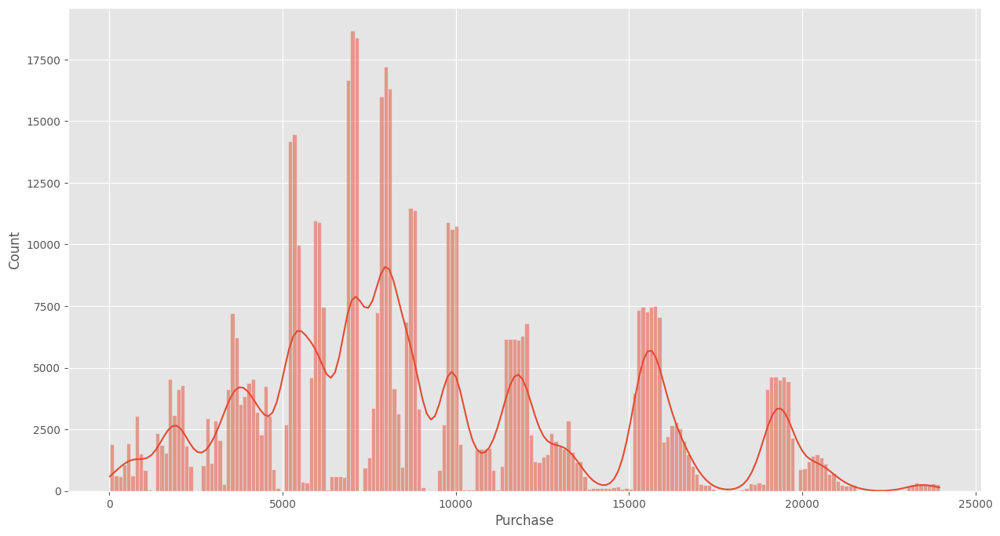

In [40]:
plt.figure(figsize = (15, 8))
sns.histplot(data = data, x = 'Purchase', kde = True, bins = 200)
plt.show()

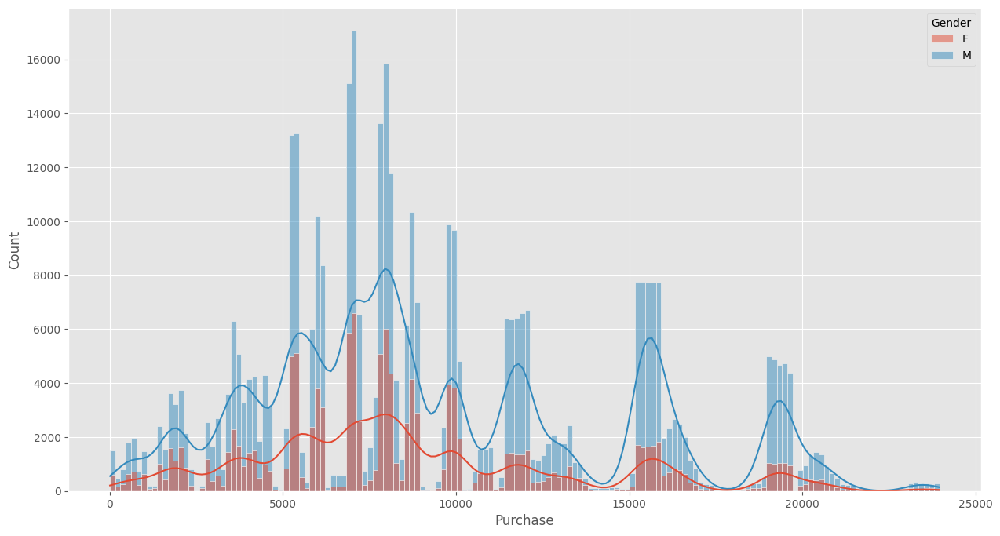

In [41]:
plt.figure(figsize = (15, 8))
sns.histplot(data = data, x = 'Purchase', kde = True, hue= "Gender")
plt.show()

<Figure size 1500x800 with 0 Axes>

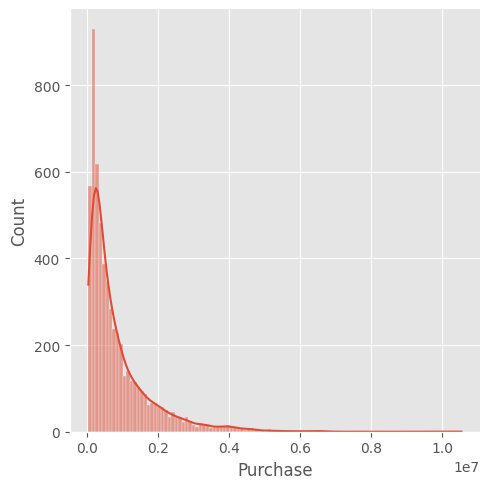

In [42]:
# distribution of purchase made per user
plt.figure(figsize = (15, 8))
purchase_per_user = data.groupby(['User_ID'])['Purchase'].sum().reset_index()
sns.displot(data = purchase_per_user, x = 'Purchase', kde = True)
plt.show()

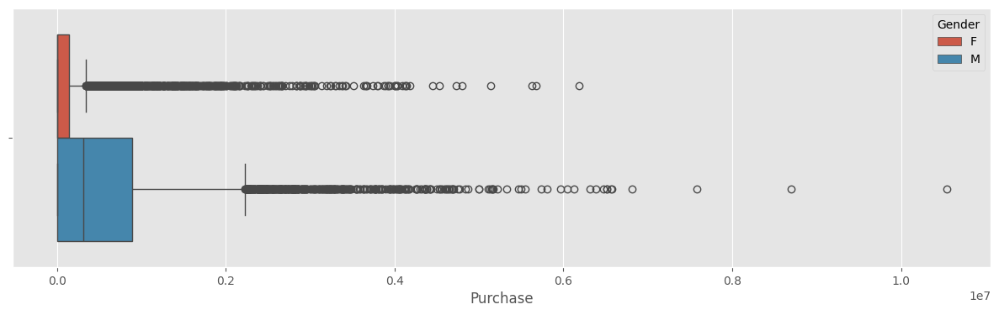

In [43]:
plt.figure(figsize=(15,4))
purchase_per_user_per_gender =  data.groupby(['Gender','User_ID'])['Purchase'].sum().reset_index()
sns.boxplot(data= purchase_per_user_per_gender, x = 'Purchase', hue = 'Gender')
plt.show()

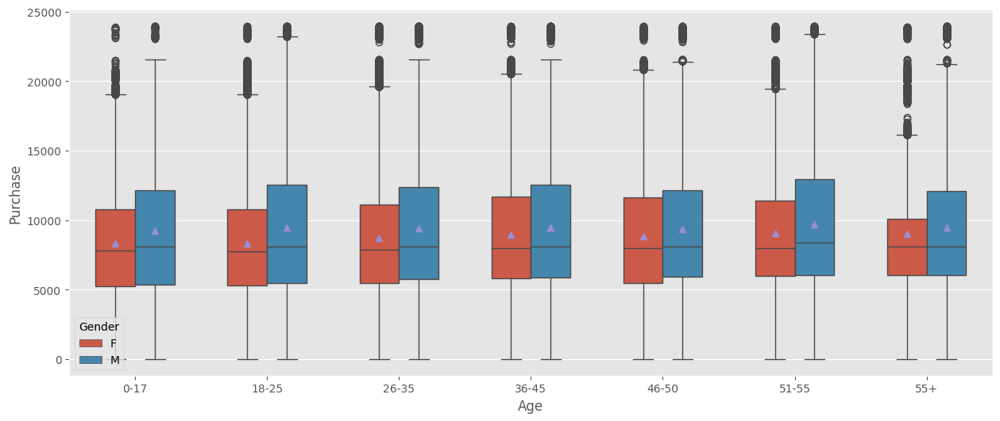

In [44]:
plt.figure(figsize = (15, 6))
sns.boxplot(data = data, x = 'Age', y = 'Purchase', hue = 'Gender', showmeans = True, width = 0.6)
plt.show()

- We see that variance in males is greater than females across all age groups
- Overall median purchase value of males is a little higher than the females except for 55+ age group where they ar quiet comparable.

[]

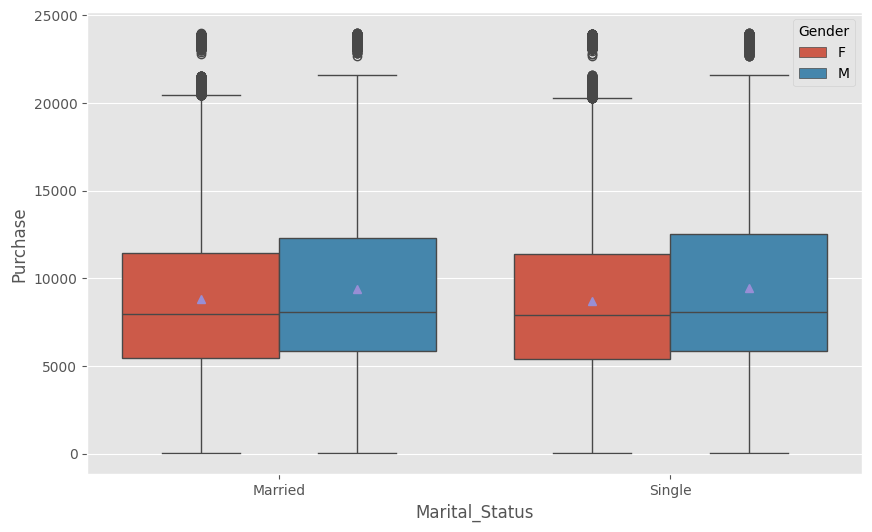

In [45]:
plt.figure(figsize = (10, 6))
sns.boxplot(data = data, x = 'Marital_Status', y = 'Purchase', hue = 'Gender', showmeans = True, width  = 0.8)
plt.plot()

- We observe that median purchase value of males is higher in both married and single categories

[]

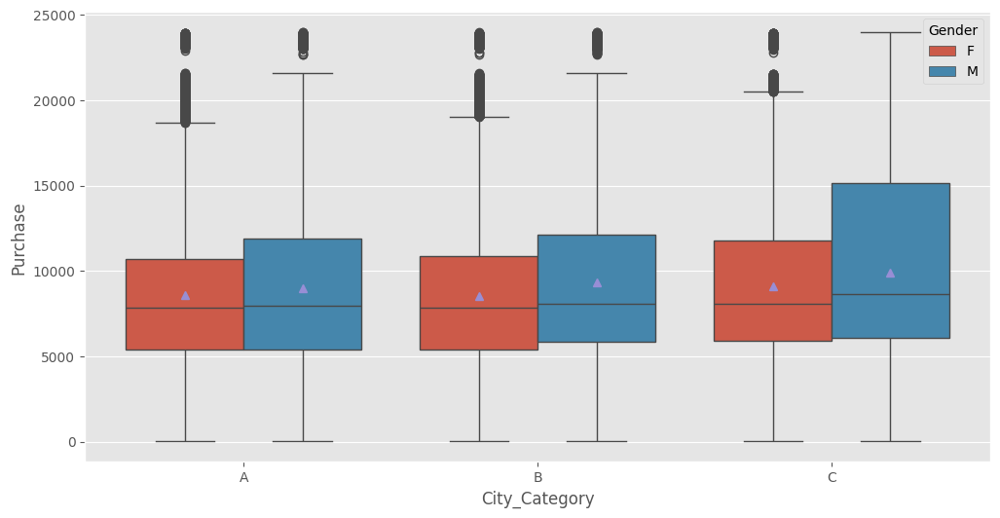

In [46]:
plt.figure(figsize = (12, 6))
sns.boxplot(data = data, x = 'City_Category', y = 'Purchase', hue = 'Gender', showmeans = True)
plt.plot()

- The median value for females in city category C is highest compared to city A and B
- The median value for males in city category C is also highest compared to city A and B.
- Overall median of males is higher than females in all three city categories

[]

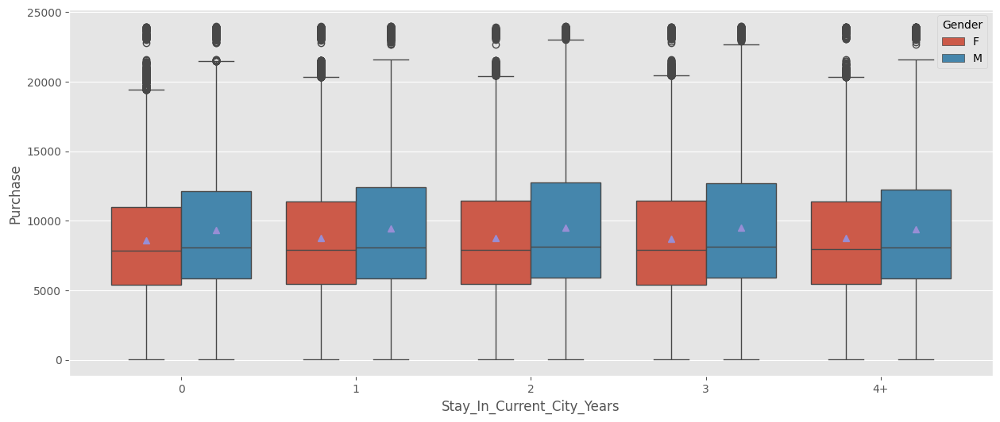

In [47]:
plt.figure(figsize = (15, 6))
sns.boxplot(data = data, x = 'Stay_In_Current_City_Years', y = 'Purchase', hue = 'Gender', showmeans = True)
plt.plot()

- We can observe for females the median values for purchase amount is a little lower for women staying for 3 and 0 years as compared to others
- For men, the median purchase values are comparable across all Stay years

In [71]:


def ci_for_purchase_gender(data, sample_size, ci):
  sample1 = data[data['Gender'] == 'M']['Purchase']
  sample2 = data[data['Gender'] == 'F']['Purchase']
  itr_size = 1000
  ci = ci/100
  # calculating z_lower and z_upper for the provided confidence interval
  z_lower = stats.norm.ppf((1-ci)/2)
  z_upper = stats.norm.ppf(ci + (1-ci)/2)

  # calculating the standard errors
  std_err_sample_1 = sample1.std()/math.sqrt(sample_size)
  std_err_sample_2 = sample2.std()/math.sqrt(sample_size)

  # means of sampling distribution
  means_sample_1 = [np.mean(sample1.sample(sample_size)) for _ in range(itr_size)]
  means_sample_2 = [np.mean(sample2.sample(sample_size)) for _ in range(itr_size)]

  # mean of sampling mean distribution
  mean_of_sample_means_1 = np.mean(means_sample_1)
  mean_of_sample_means_2 = np.mean(means_sample_2)

  # confidence intervals for the 2 samples
  ci_sample1 = (mean_of_sample_means_1 + z_lower*std_err_sample_1,mean_of_sample_means_1 + z_upper*std_err_sample_1)
  ci_sample2 = (mean_of_sample_means_2 + z_lower*std_err_sample_2,mean_of_sample_means_2 + z_upper*std_err_sample_2)

  # plotting the intervals
  plt.figure(figsize=(16,8))
  plt.title(f'Sample Size: {sample_size}, Male Average: {round(mean_of_sample_means_1,2)}, Male Std: {round(np.std(means_sample_1),2)},Female Average: {round(mean_of_sample_means_2,2)}, Female Std: {round(np.std(means_sample_2),2)}')
  sns.kdeplot(means_sample_1, fill = True)
  plt.axvline(ci_sample1[0],color = '#FF69B4', linestyle = 'dashdot',label = f"Lower Limit Male: {round(ci_sample1[0],2)}")
  plt.axvline(ci_sample1[1],color = '#FF69B4', linestyle = 'dashdot',label = f"Upper Limit Male: {round(ci_sample1[1],2)}")
  sns.kdeplot(means_sample_2, fill= True)
  plt.axvline(ci_sample2[0],linestyle = 'dashdot',color = '#4682B4', label = f"Lower Limit Female: {round(ci_sample2[0],2)}")
  plt.axvline(ci_sample2[1],linestyle = 'dashdot',color = '#4682B4', label = f"Upper Limit Female: {round(ci_sample2[1],2)}")
  plt.legend(loc = 'upper right')
  plt.show()
  df = pd.DataFrame({"Gender":["M","F"],"Sample Size": [sample_size,sample_size], "Lower Limit":[round(ci_sample1[0],2),round(ci_sample2[0],2)],
                     "Upper Limit": [round(ci_sample1[1],2),round(ci_sample2[1],2)],
                     "Sample Mean":[round(mean_of_sample_means_1,2), round(mean_of_sample_means_2,2)],
                     "Standard Error":[std_err_sample_1,std_err_sample_2]})
  df['conficence'] = ci * 100
  return df

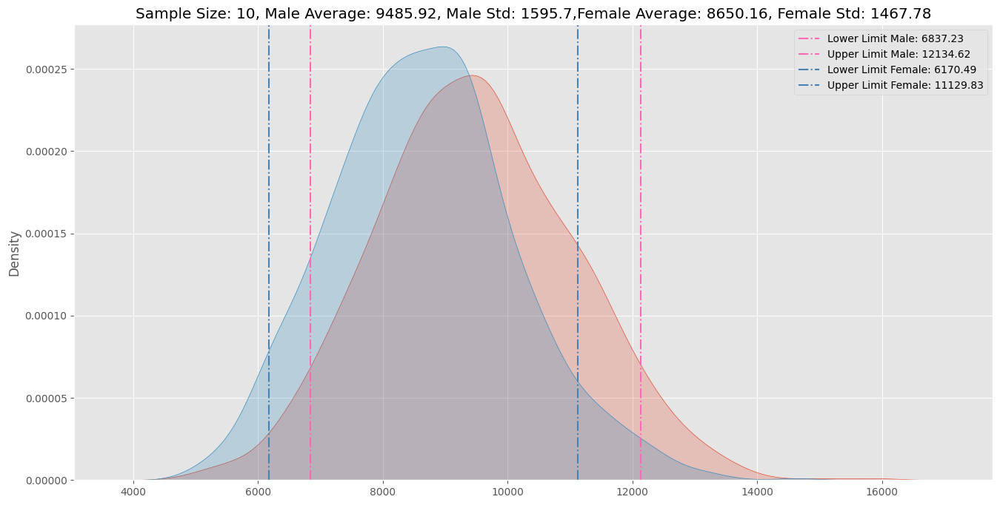

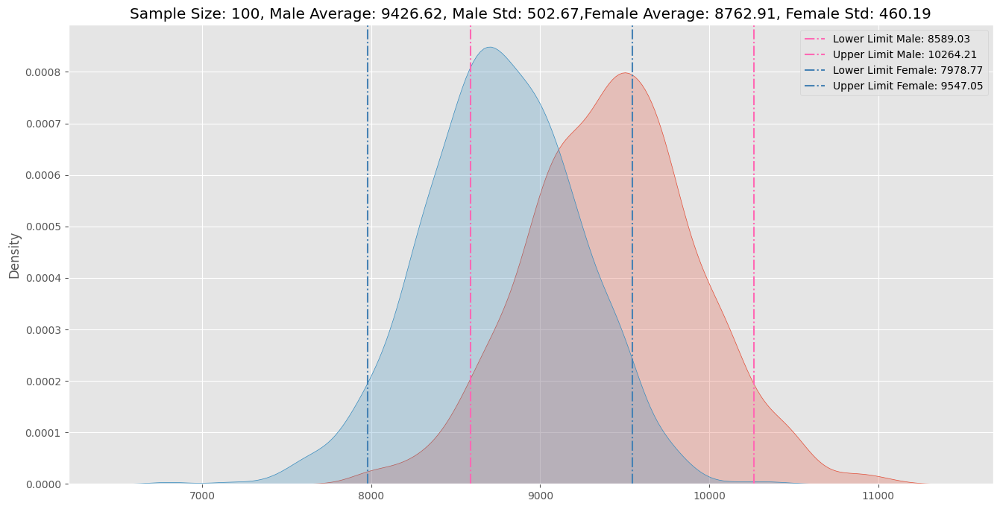

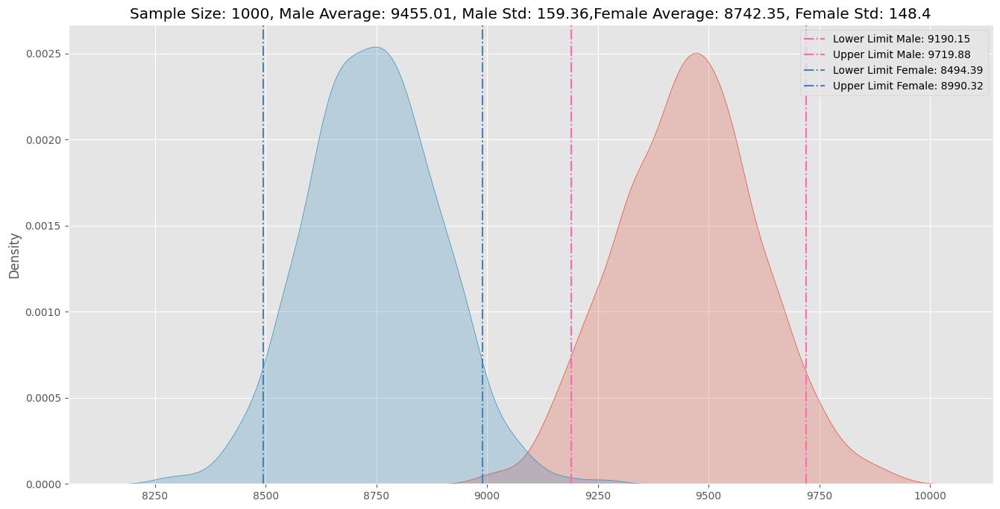

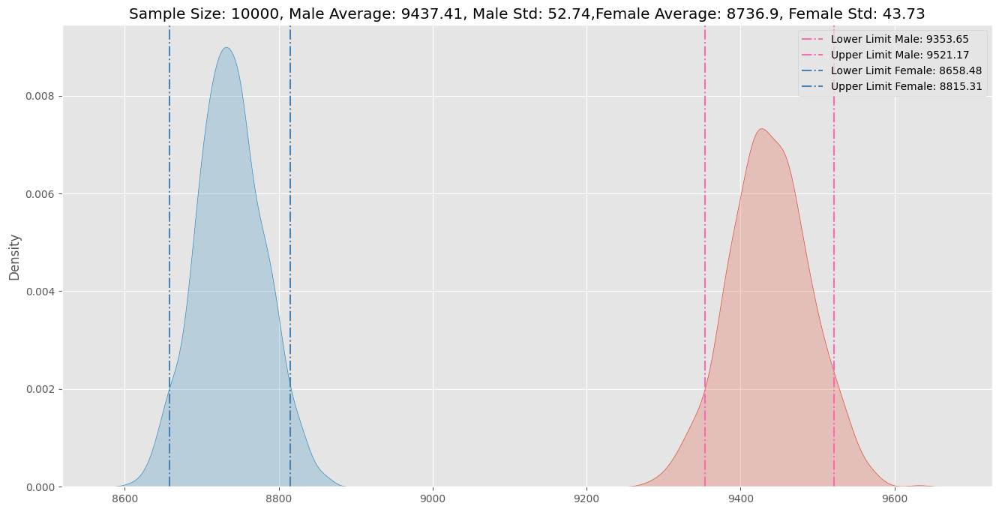

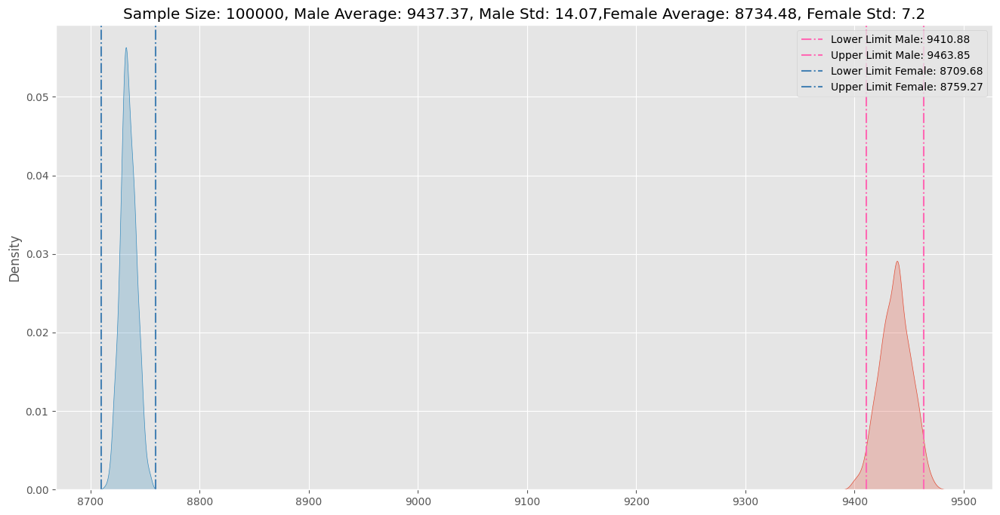

In [76]:
# Gender wise Purchase habits

# Plotting the mean of 1000 Random Samples of sizes 10,100,1000,10000 and 100000 with 90% Confidence Interval

sample_sizes = [10,100,1000,10_000 ,100_000]

df_purchase_gender = pd.DataFrame()
for sample_size in sample_sizes:
  df_purchase_gender = pd.concat([df_purchase_gender,ci_for_purchase_gender(data, sample_size, 90)], axis = 0)




In [80]:
df_purchase_gender

,Gender,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,conficence
0,M,10,6837.23,12134.62,9485.92,1610.290669,90.0
1,F,10,6170.49,11129.83,8650.16,1507.531533,90.0
0,M,100,8589.03,10264.21,9426.62,509.218621,90.0
1,F,100,7978.77,9547.05,8762.91,476.723329,90.0
0,M,1000,9190.15,9719.88,9455.01,161.029067,90.0
1,F,1000,8494.39,8990.32,8742.35,150.753153,90.0
0,M,10000,9353.65,9521.17,9437.41,50.921862,90.0
1,F,10000,8658.48,8815.31,8736.90,47.672333,90.0
0,M,100000,9410.88,9463.85,9437.37,16.102907,90.0
1,F,100000,8709.68,8759.27,8734.48,15.075315,90.0


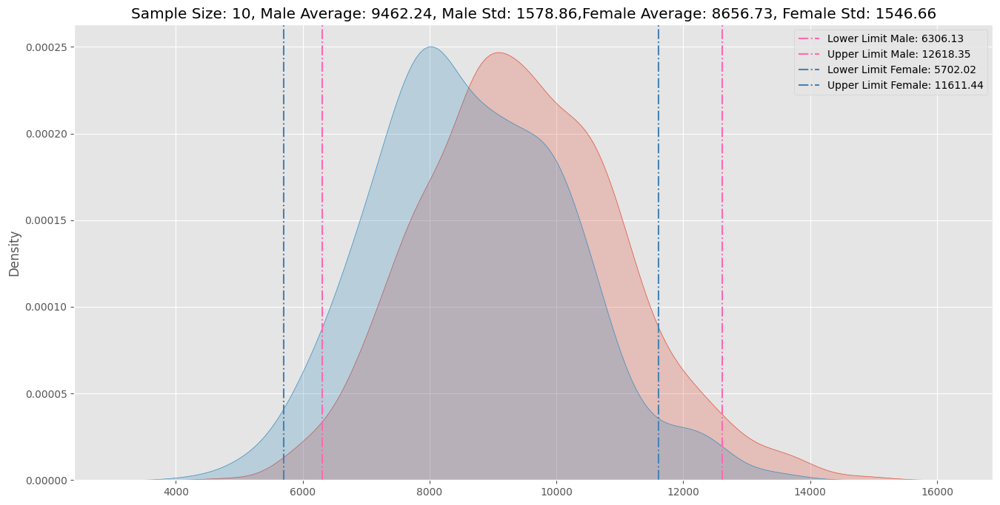

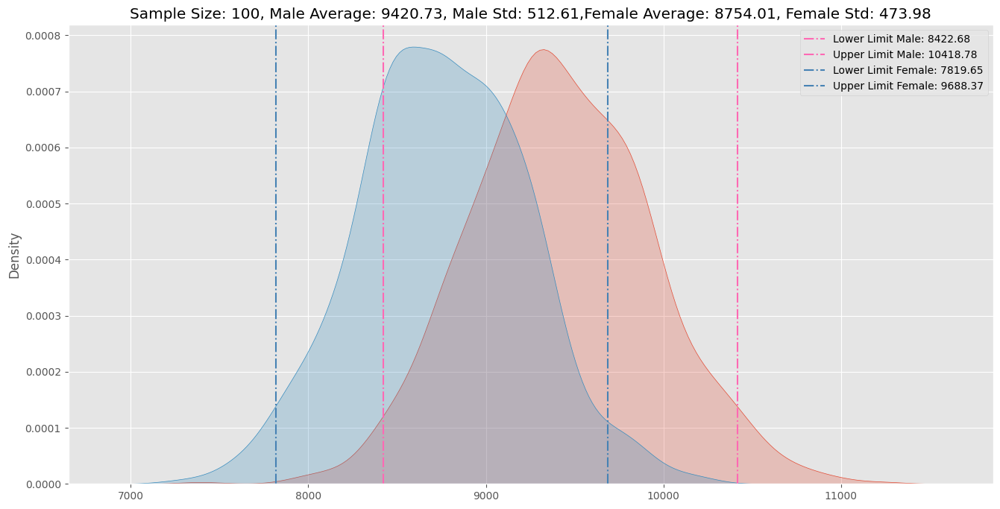

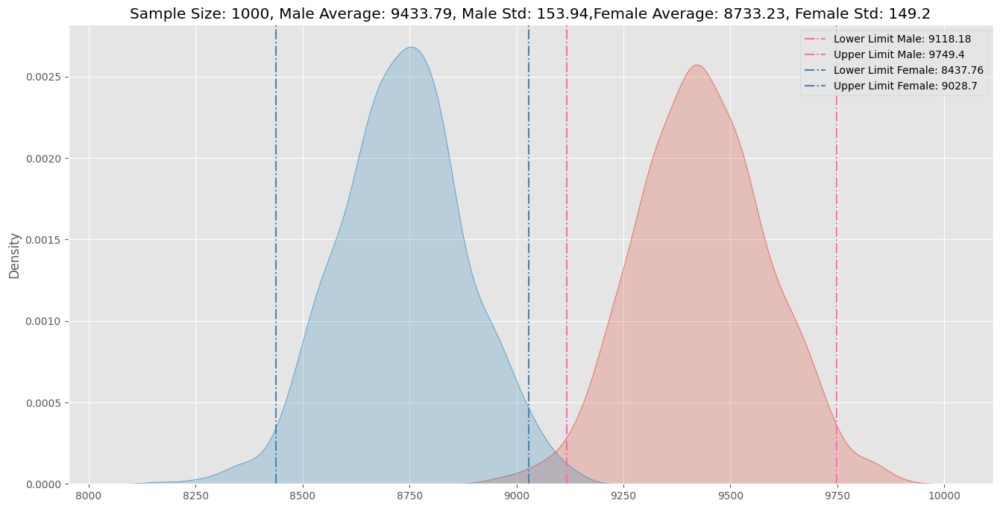

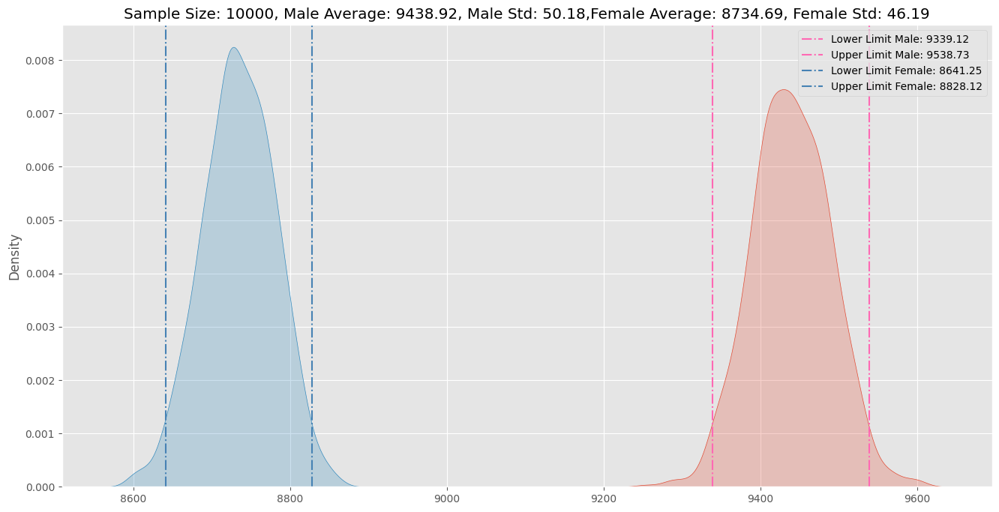

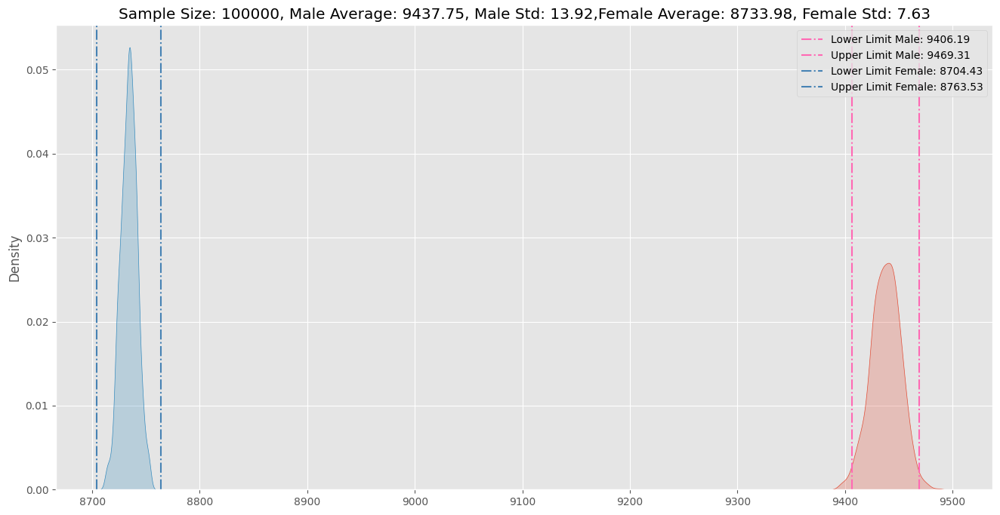

In [81]:
# Plotting the mean of 1000 Random Samples of sizes 10,100,1000,10000 and 100000 with 95% Confidence Interval

sample_sizes = [10,100,1000,10_000 ,100_000]

for sample_size in sample_sizes:
  df_purchase_gender = pd.concat([df_purchase_gender,ci_for_purchase_gender(data, sample_size, 95)], axis = 0)

In [84]:
df_purchase_gender = df_purchase_gender.reset_index(drop = "index")
df_purchase_gender['Interval Range'] = df_purchase_gender['Upper Limit'] - df_purchase_gender['Lower Limit']
df_purchase_gender

,Gender,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,conficence,Interval Range
0,M,10,6837.23,12134.62,9485.92,1610.290669,90.0,5297.39
1,F,10,6170.49,11129.83,8650.16,1507.531533,90.0,4959.34
2,M,100,8589.03,10264.21,9426.62,509.218621,90.0,1675.18
3,F,100,7978.77,9547.05,8762.91,476.723329,90.0,1568.28
4,M,1000,9190.15,9719.88,9455.01,161.029067,90.0,529.73
5,F,1000,8494.39,8990.32,8742.35,150.753153,90.0,495.93
6,M,10000,9353.65,9521.17,9437.41,50.921862,90.0,167.52
7,F,10000,8658.48,8815.31,8736.90,47.672333,90.0,156.83
8,M,100000,9410.88,9463.85,9437.37,16.102907,90.0,52.97
9,F,100000,8709.68,8759.27,8734.48,15.075315,90.0,49.59


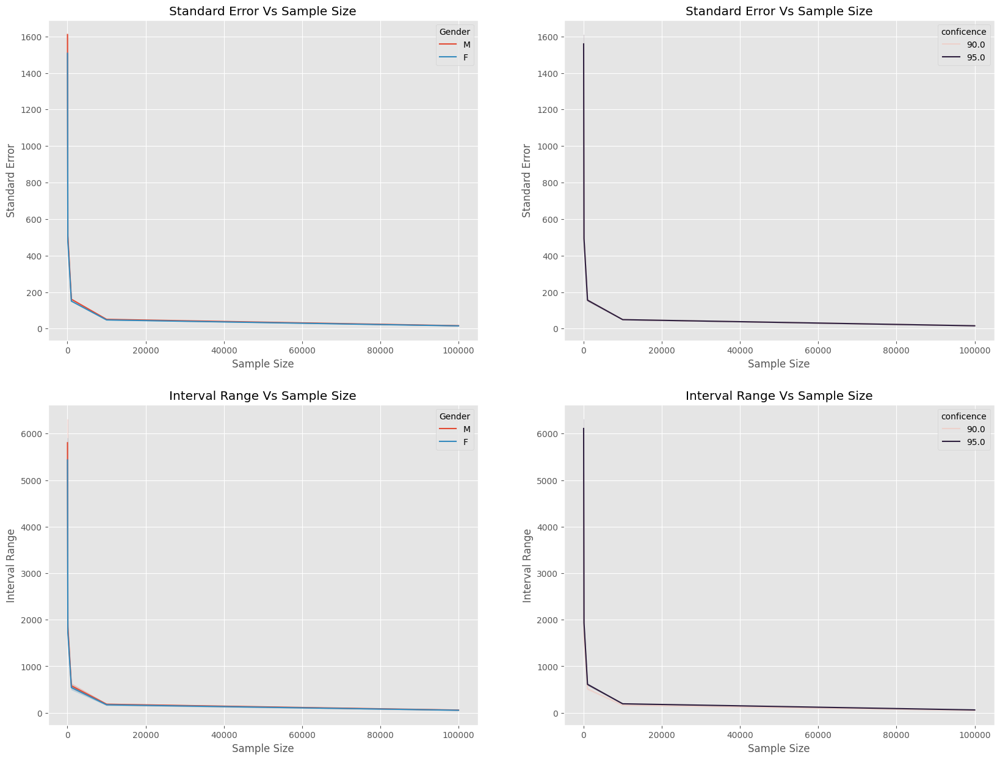

In [99]:
# variation of standard error and interval range with increase in sample size (across Gender and Confidence)

plt.figure(figsize = (20,15))
plt.subplot(2,2,1)
plt.title("Standard Error Vs Sample Size")
sns.lineplot(data = df_purchase_gender, x= 'Sample Size', y= 'Standard Error', hue= "Gender")

plt.subplot(2,2,2)
plt.title("Standard Error Vs Sample Size")
sns.lineplot(data = df_purchase_gender, x= 'Sample Size', y= 'Standard Error', hue= "conficence")


plt.subplot(2,2,3)
plt.title("Interval Range Vs Sample Size")
sns.lineplot(data = df_purchase_gender, x= 'Sample Size', y= 'Interval Range', hue= "Gender")

plt.subplot(2,2,4)
plt.title("Interval Range Vs Sample Size")
sns.lineplot(data = df_purchase_gender, x= 'Sample Size', y= 'Interval Range', hue= "conficence")

plt.show()

As the sample sizes are increasing we see that:
- Interval Ranges are decreasing
- Standard Error is decreasing


We can observe that

- The CI with 90% confidence for sample size 10 for Males is [6837.23, 12134.62]
- The CI with 90% confidence for sample size 10 for Females is [6170.49, 11129.83]

- For Sample size 10 The confidence interval for both Male and Female is overlapping

But as the sample size increases, we can see the interval ranges seperating and then finally they both do not overalap.

- The CI with 90% confidence for sample size 100000 for Males is [9410.88, 9463.85]

- The CI with 90% confidence for sample size 100000 for Females is [8709.68, 8759.27]

For Sample size 100000 The confidence interval for both Male and Female is not overlapping.



We can also observe the same with 95% Confidence.

- The CI with 95% confidence for sample size 10 for Males is [6306.13,	12618.35]

- The CI with 95% confidence for sample size 10 for Females is [5702.02,	11611.44]

For Sample size 10 The confidence interval for both Male and Female is overlapping

and as the sample size increases, we can see the interval ranges seperating and then finally they both dont overalap.

- The CI with 95% confidence for sample size 100000 for Males is [9406.19,	9469.31]

- The CI with 95% confidence for sample size 100000 for Females is [8704.43, 	8763.53]

For Sample size 100000 The confidence interval for both Male and Female is now not overlapping.

In [102]:
# Marital Status wise Purchase habits
def ci_for_purchase_marital_status(data, sample_size, ci):
  sample1 = data[data['Marital_Status'] == 'Single']['Purchase']
  sample2 = data[data['Marital_Status'] == 'Married']['Purchase']
  itr_size = 1000
  ci = ci/100
  # calculating z_lower and z_upper for the provided confidence interval
  z_lower = stats.norm.ppf((1-ci)/2)
  z_upper = stats.norm.ppf(ci + (1-ci)/2)

  # calculating the standard errors
  std_err_sample_1 = sample1.std()/math.sqrt(sample_size)
  std_err_sample_2 = sample2.std()/math.sqrt(sample_size)

  # means of sampling distribution
  means_sample_1 = [np.mean(sample1.sample(sample_size)) for _ in range(itr_size)]
  means_sample_2 = [np.mean(sample2.sample(sample_size)) for _ in range(itr_size)]

  # mean of sampling mean distribution
  mean_of_sample_means_1 = np.mean(means_sample_1)
  mean_of_sample_means_2 = np.mean(means_sample_2)

  # confidence intervals for the 2 samples
  ci_sample1 = (mean_of_sample_means_1 + z_lower*std_err_sample_1,mean_of_sample_means_1 + z_upper*std_err_sample_1)
  ci_sample2 = (mean_of_sample_means_2 + z_lower*std_err_sample_2,mean_of_sample_means_2 + z_upper*std_err_sample_2)

  # plotting the intervals
  plt.figure(figsize=(16,8))
  plt.title(f'Sample Size: {sample_size}, Single Average: {round(mean_of_sample_means_1,2)}, Single Std: {round(np.std(means_sample_1),2)},Married Average: {round(mean_of_sample_means_2,2)}, Married Std: {round(np.std(means_sample_2),2)}')
  sns.kdeplot(means_sample_1, fill = True)
  plt.axvline(ci_sample1[0],color = '#FF69B4', linestyle = 'dashdot',label = f"Lower Limit Single: {round(ci_sample1[0],2)}")
  plt.axvline(ci_sample1[1],color = '#FF69B4', linestyle = 'dashdot',label = f"Upper Limit Sinlge: {round(ci_sample1[1],2)}")
  sns.kdeplot(means_sample_2, fill= True)
  plt.axvline(ci_sample2[0],linestyle = 'dashdot',color = '#4682B4', label = f"Lower Limit Married: {round(ci_sample2[0],2)}")
  plt.axvline(ci_sample2[1],linestyle = 'dashdot',color = '#4682B4', label = f"Upper Limit Married: {round(ci_sample2[1],2)}")
  plt.legend(loc = 'upper right')
  plt.show()
  df = pd.DataFrame({"Marital Status":["Single","Married"],"Sample Size": [sample_size,sample_size], "Lower Limit":[round(ci_sample1[0],2),round(ci_sample2[0],2)],
                     "Upper Limit": [round(ci_sample1[1],2),round(ci_sample2[1],2)],
                     "Sample Mean":[round(mean_of_sample_means_1,2), round(mean_of_sample_means_2,2)],
                     "Standard Error":[std_err_sample_1,std_err_sample_2]})
  df['confidence'] = ci * 100
  return df

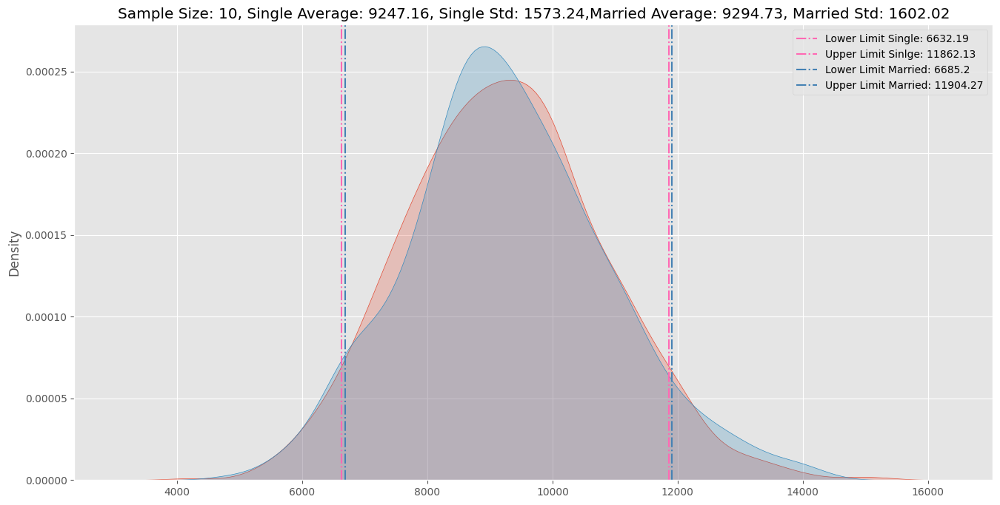

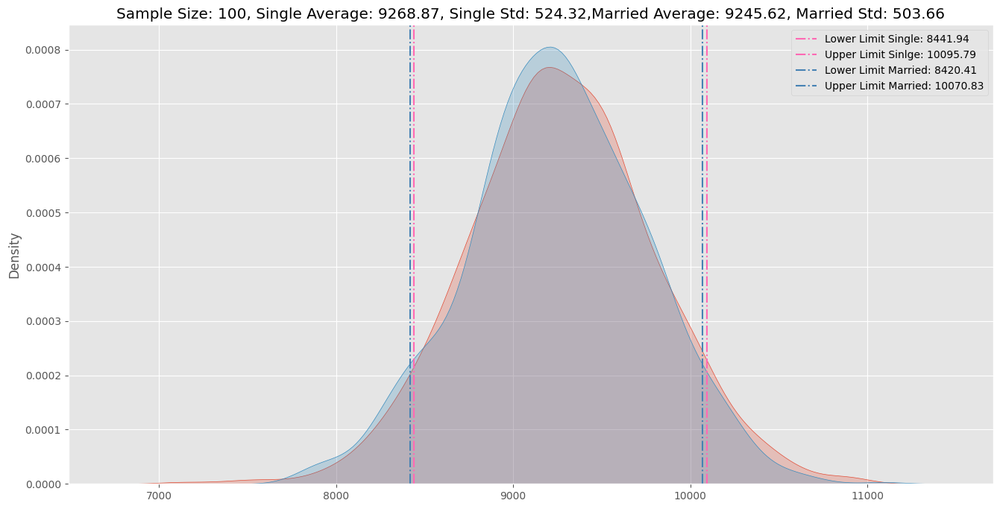

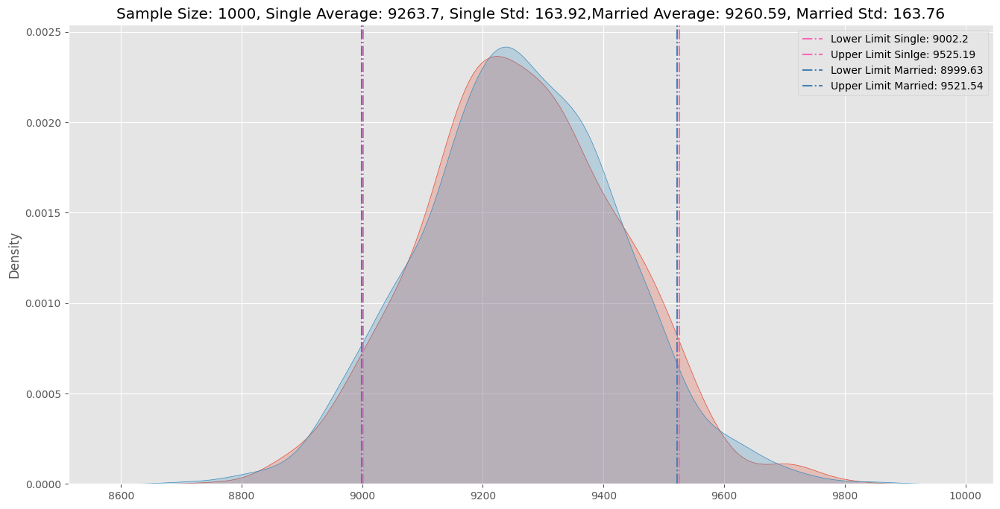

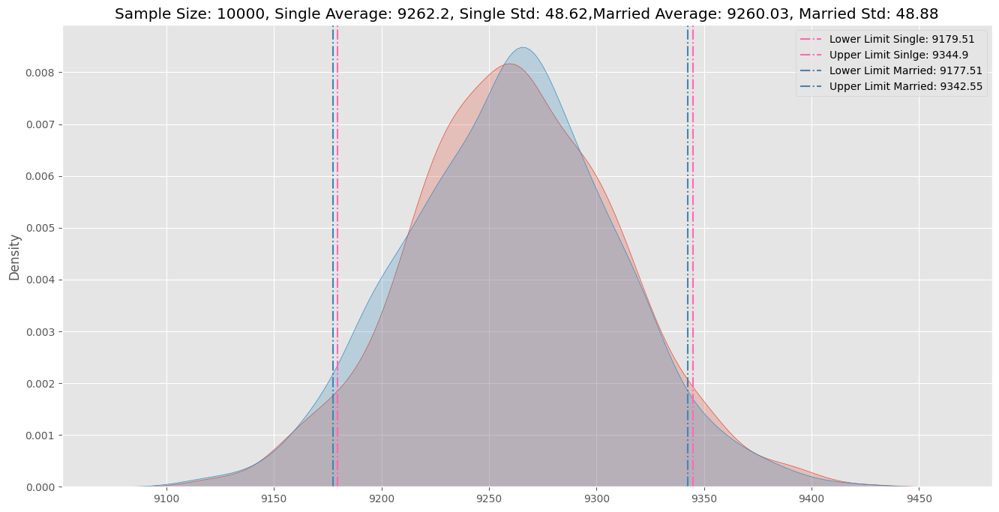

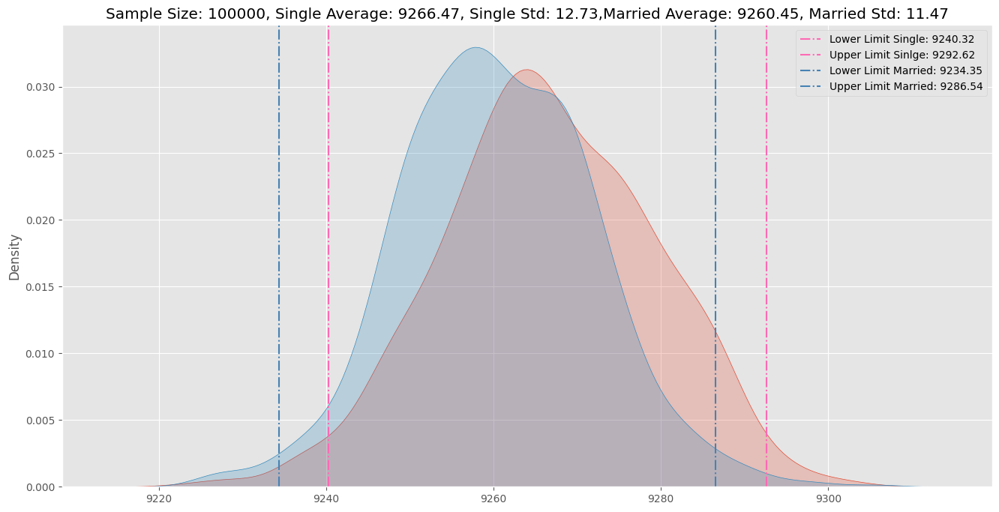

In [110]:
# Plotting the mean of 1000 Random Samples of sizes 10,100,1000,10000 and 100000 with 90% Confidence Interval

sample_sizes = [10,100,1000,10_000 ,100_000]

df_purchase_marital_status = pd.DataFrame()
for sample_size in sample_sizes:
  df_purchase_marital_status = pd.concat([df_purchase_marital_status,ci_for_purchase_marital_status(data, sample_size, 90)], axis = 0)

In [105]:
df_purchase_marital_status

,Marital Status,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,confidence
0,Single,10,6658.33,11888.26,9273.30,1589.786982,90.0
1,Married,10,6609.99,11829.05,9219.52,1586.482250,90.0
0,Single,100,8427.20,10081.05,9254.13,502.734786,90.0
1,Married,100,8418.35,10068.76,9243.56,501.689738,90.0
0,Single,1000,8993.54,9516.53,9255.03,158.978698,90.0
1,Married,1000,9001.28,9523.19,9262.23,158.648225,90.0
0,Single,10000,9184.87,9350.25,9267.56,50.273479,90.0
1,Married,10000,9177.62,9342.66,9260.14,50.168974,90.0
0,Single,100000,9239.20,9291.50,9265.35,15.897870,90.0
1,Married,100000,9235.45,9287.64,9261.54,15.864823,90.0


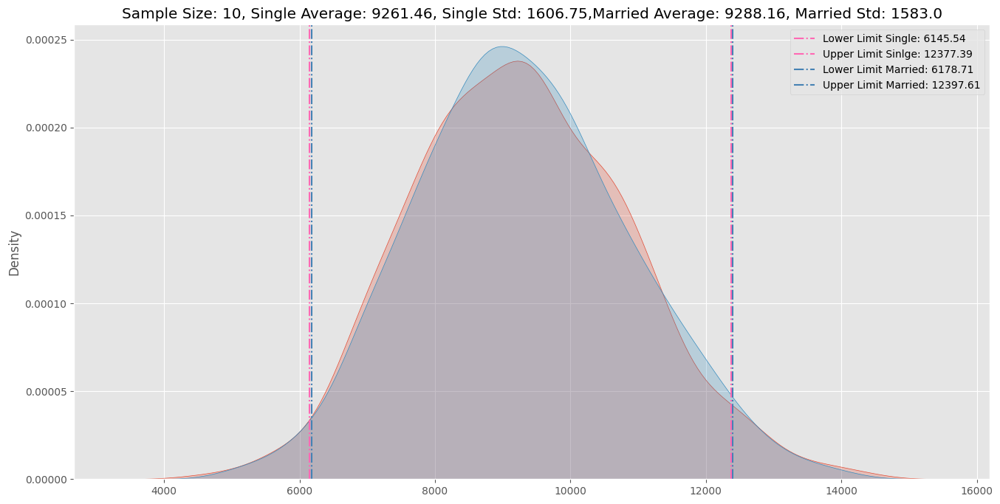

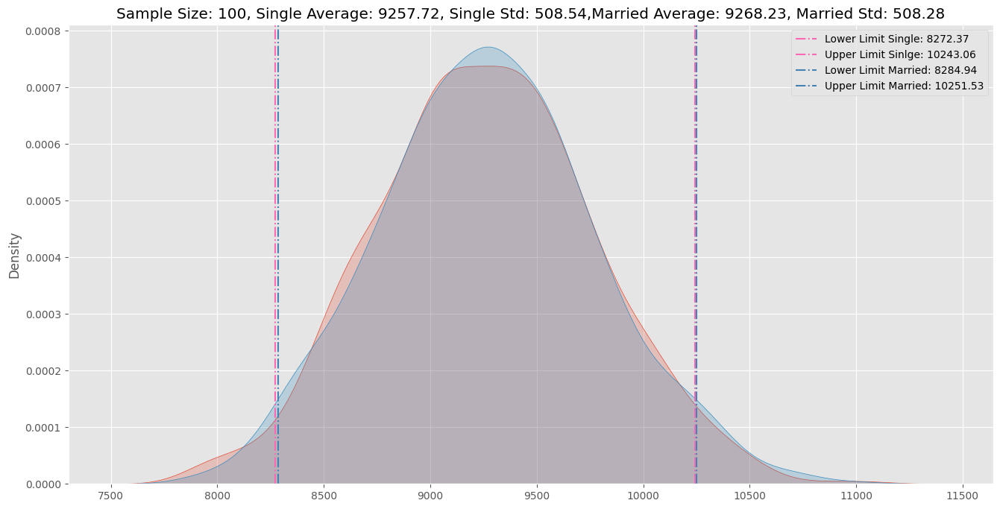

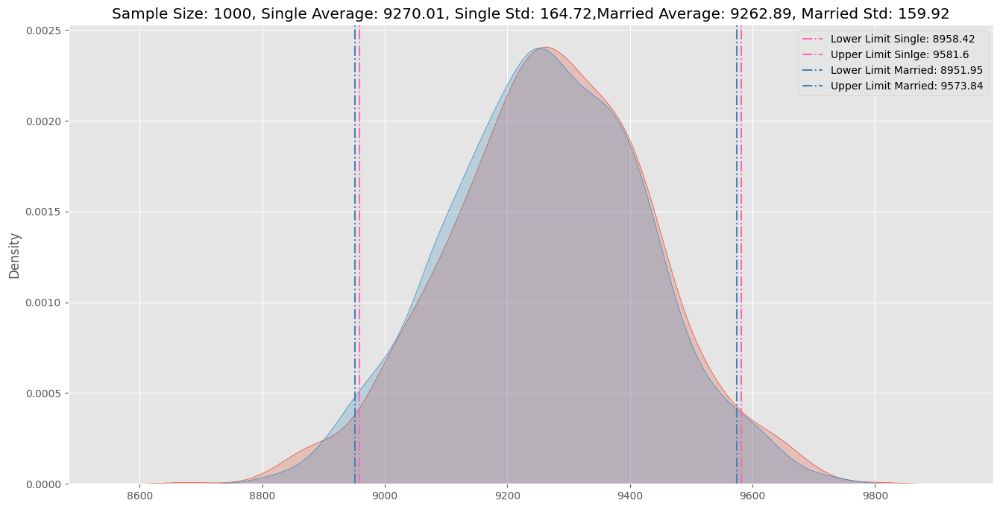

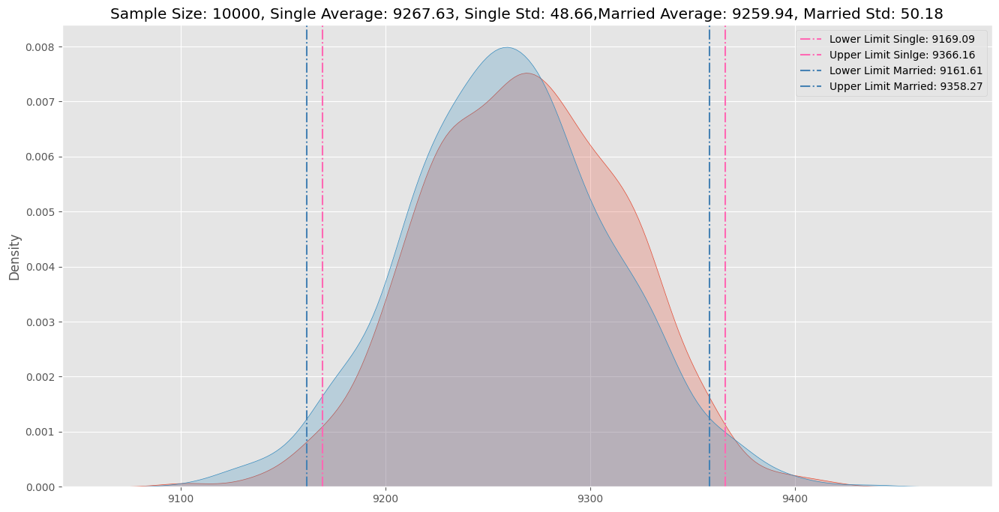

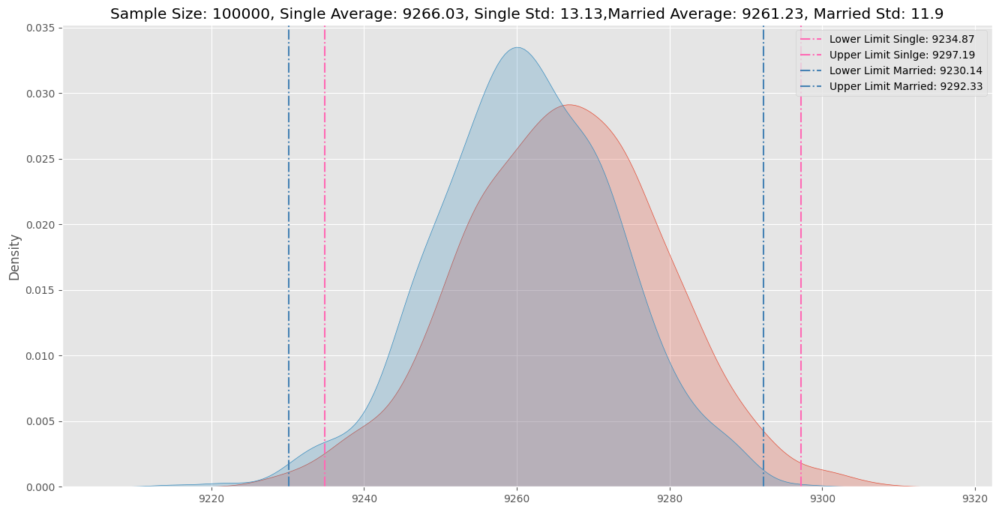

In [111]:
# Plotting the mean of 1000 Random Samples of sizes 10,100,1000,10000 and 100000 with 95% Confidence Interval

sample_sizes = [10,100,1000,10_000 ,100_000]

for sample_size in sample_sizes:
  df_purchase_marital_status = pd.concat([df_purchase_marital_status,ci_for_purchase_marital_status(data, sample_size, 95)], axis = 0)

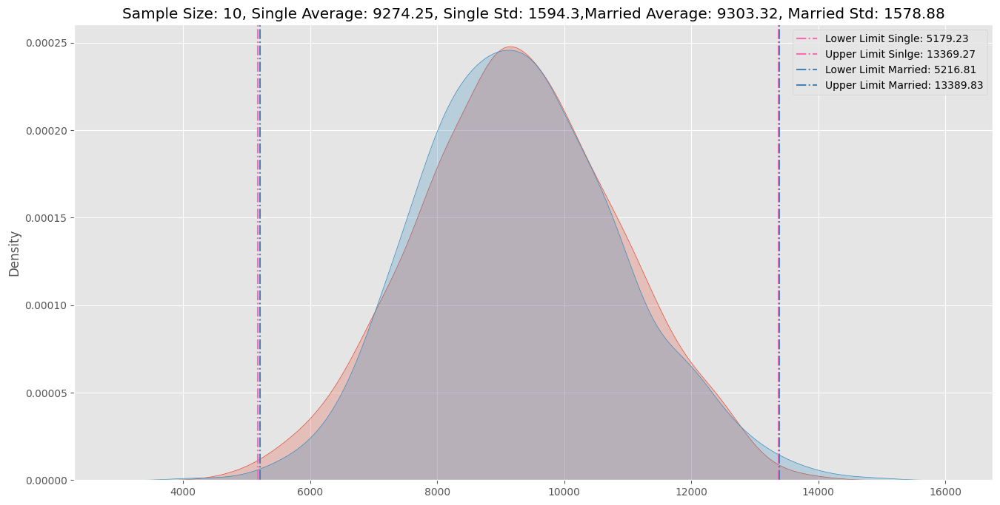

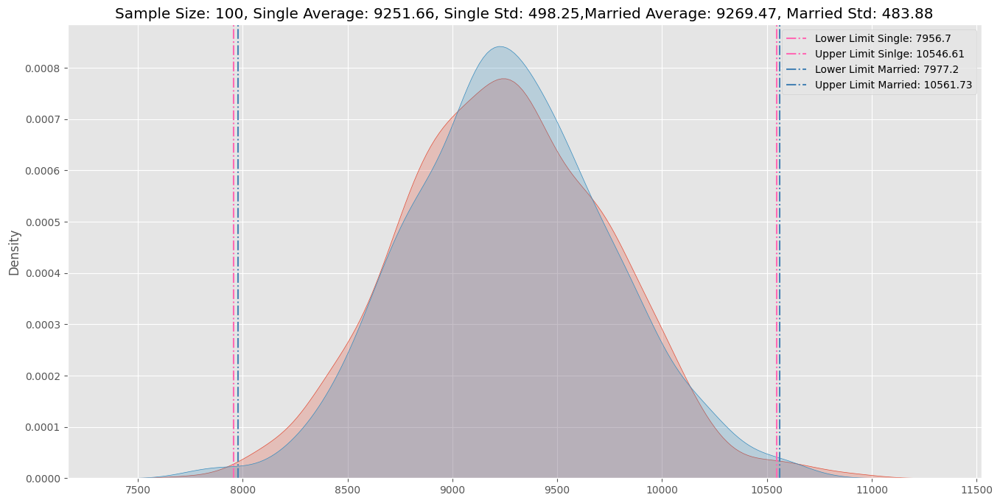

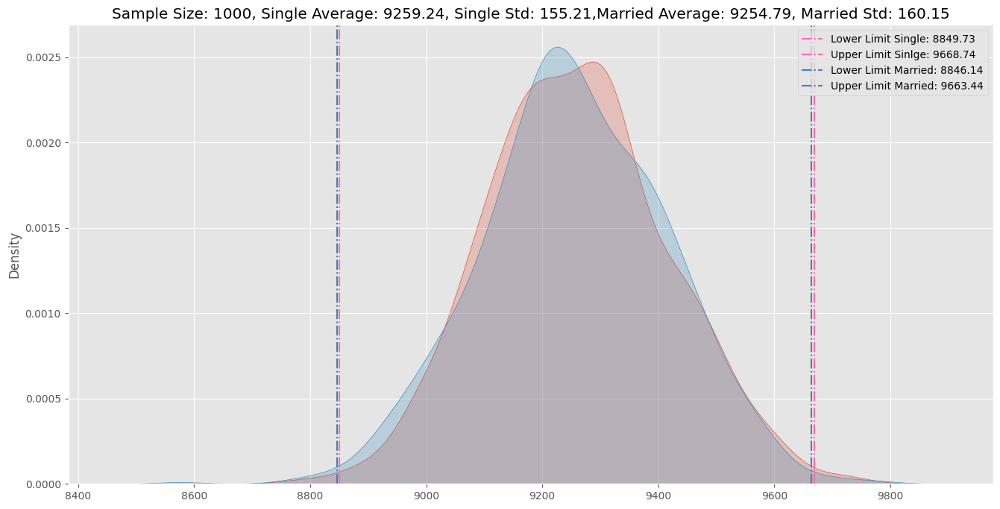

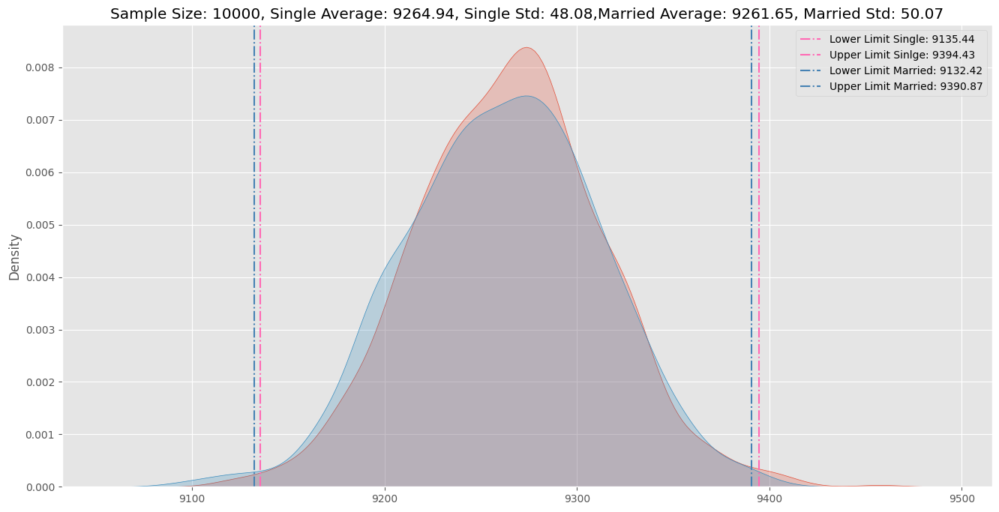

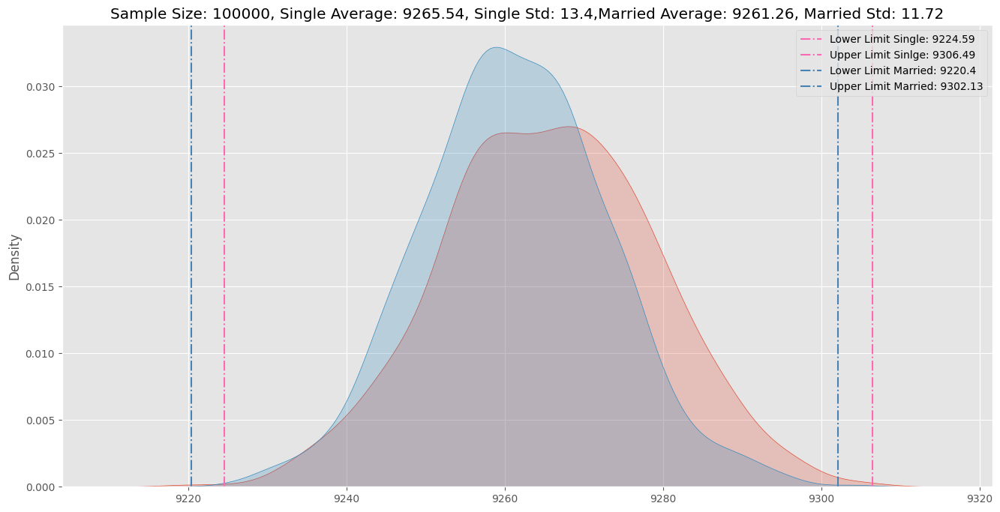

In [112]:
# Plotting the mean of 1000 Random Samples of sizes 10,100,1000,10000 and 100000 with 99% Confidence Interval

sample_sizes = [10,100,1000,10_000 ,100_000]

for sample_size in sample_sizes:
  df_purchase_marital_status = pd.concat([df_purchase_marital_status,ci_for_purchase_marital_status(data, sample_size, 99)], axis = 0)

In [113]:
df_purchase_marital_status = df_purchase_marital_status.reset_index(drop = "index")
df_purchase_marital_status['Interval Range'] = df_purchase_marital_status['Upper Limit'] - df_purchase_marital_status['Lower Limit']
df_purchase_marital_status

,Marital Status,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,confidence,Interval Range
0,Single,10,6632.19,11862.13,9247.16,1589.786982,90.0,5229.94
1,Married,10,6685.20,11904.27,9294.73,1586.482250,90.0,5219.07
2,Single,100,8441.94,10095.79,9268.87,502.734786,90.0,1653.85
3,Married,100,8420.41,10070.83,9245.62,501.689738,90.0,1650.42
4,Single,1000,9002.20,9525.19,9263.70,158.978698,90.0,522.99
5,Married,1000,8999.63,9521.54,9260.59,158.648225,90.0,521.91
6,Single,10000,9179.51,9344.90,9262.20,50.273479,90.0,165.39
7,Married,10000,9177.51,9342.55,9260.03,50.168974,90.0,165.04
8,Single,100000,9240.32,9292.62,9266.47,15.897870,90.0,52.30
9,Married,100000,9234.35,9286.54,9260.45,15.864823,90.0,52.19


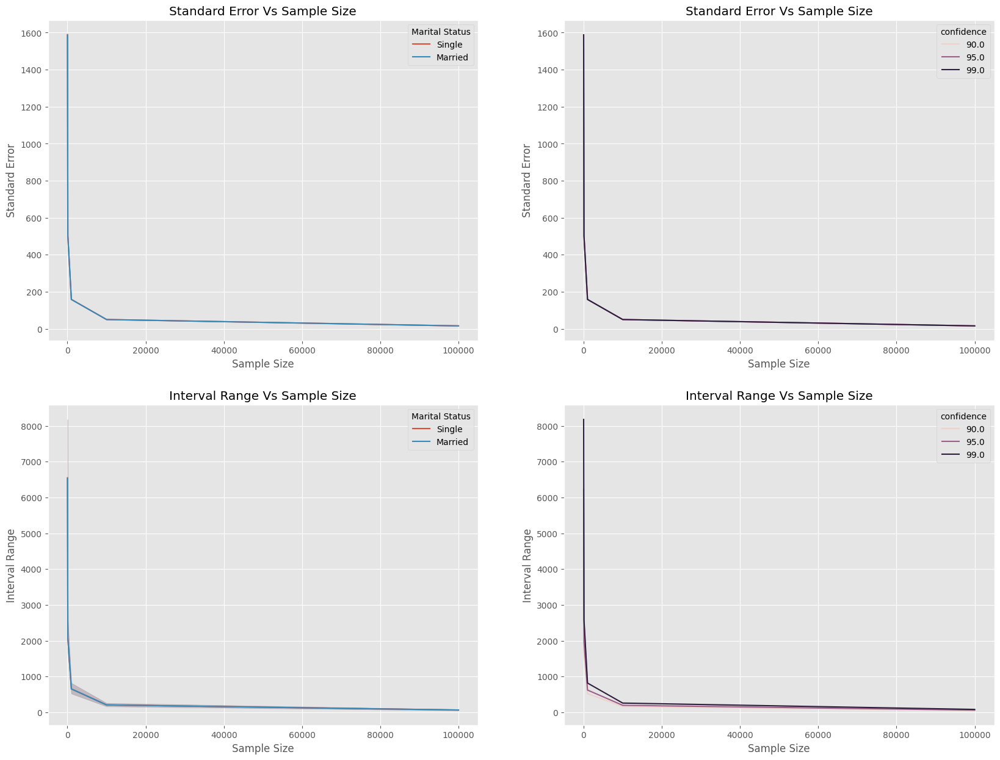

In [114]:
# variation of standard error and interval range with increase in sample size (across Marital Status and Confidence)

plt.figure(figsize = (20,15))
plt.subplot(2,2,1)
plt.title("Standard Error Vs Sample Size")
sns.lineplot(data = df_purchase_marital_status, x= 'Sample Size', y= 'Standard Error', hue= "Marital Status")

plt.subplot(2,2,2)
plt.title("Standard Error Vs Sample Size")
sns.lineplot(data = df_purchase_marital_status, x= 'Sample Size', y= 'Standard Error', hue= "confidence")


plt.subplot(2,2,3)
plt.title("Interval Range Vs Sample Size")
sns.lineplot(data = df_purchase_marital_status, x= 'Sample Size', y= 'Interval Range', hue= "Marital Status")

plt.subplot(2,2,4)
plt.title("Interval Range Vs Sample Size")
sns.lineplot(data = df_purchase_marital_status, x= 'Sample Size', y= 'Interval Range', hue= "confidence")

plt.show()

As the sample sizes are increasing we see that:
- Interval Ranges are decreasing
- Standard Error is decreasing

We can observe that

- The CI with 90% confidence for sample size 10 for Males is [6632.19	11862.13]
- The CI with 90% confidence for sample size 10 for Females is [6685.20	11904.27	]

- For Sample size 10 The confidence interval for both Single and Married is overlapping

As the sample size increases, we can see the interval ranges are still overlapping

- The CI with 90% confidence for sample size 100000 for Single is [9240.32	9292.62	]

- The CI with 90% confidence for sample size 100000 for Married is [9234.35	9286.54]

For Sample size 100000 The confidence interval for both Male and Female is not overlapping.



We can also observe the same with 95% Confidence.

- The CI with 99%% confidence for sample size 10 for Single is [5179.23	13369.27	]

- The CI with 99% confidence for sample size 10 for Married is [5216.81	13389.83]

For Sample size 10 The confidence interval for both Single and Married is overlapping

and as the sample size increases, we can see the interval ranges are still overlapping.

- The CI with 99% confidence for sample size 100000 for Single is [9224.59	9306.49]

- The CI with 99% confidence for sample size 100000 for Married is [9220.40	9302.13]

For Sample size 100000 The confidence interval for both Single and Married is now not overlapping.

`This overlap may signify that there is no significant impact of Marital Status on the purchasing behaviour of customers.`

In [115]:
data['Age'].unique()

['0-17', '55+', '26-35', '46-50', '51-55', '36-45', '18-25']
Categories (7, object): ['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+']

In [122]:
# Age groups wise purchase habits

def ci_for_purchase_age(data, sample_size, age_group, ci):
  sample1 = data[data['Age'] == age_group]['Purchase']

  itr_size = 1000
  ci = ci/100
  # calculating z_lower and z_upper for the provided confidence interval
  z_lower = stats.norm.ppf((1-ci)/2)
  z_upper = stats.norm.ppf(ci + (1-ci)/2)

  # calculating the standard errors
  std_err_sample_1 = sample1.std()/math.sqrt(sample_size)


  # means of sampling distribution
  means_sample_1 = [np.mean(sample1.sample(sample_size)) for _ in range(itr_size)]


  # mean of sampling mean distribution
  mean_of_sample_means_1 = np.mean(means_sample_1)


  # confidence intervals for the 2 samples
  ci_sample1 = (mean_of_sample_means_1 + z_lower*std_err_sample_1,mean_of_sample_means_1 + z_upper*std_err_sample_1)

  # plotting the intervals
  plt.figure(figsize=(16,8))
  plt.title(f'Sample Size: {sample_size}, {age_group} Average: {round(mean_of_sample_means_1,2)}, {age_group} Std: {round(np.std(means_sample_1),2)}')
  sns.kdeplot(means_sample_1, fill = True)
  plt.axvline(ci_sample1[0],color = '#FF69B4', linestyle = 'dashdot',label = f"Lower Limit Single: {round(ci_sample1[0],2)}")
  plt.axvline(ci_sample1[1],color = '#FF69B4', linestyle = 'dashdot',label = f"Upper Limit Sinlge: {round(ci_sample1[1],2)}")
  plt.legend(loc = 'upper right')
  plt.show()
  df = pd.DataFrame({"Age":[age_group],"Sample Size": [sample_size], "Lower Limit":[round(ci_sample1[0],2)],
                     "Upper Limit": [round(ci_sample1[1],2)],
                     "Sample Mean":[round(mean_of_sample_means_1,2)],
                     "Standard Error":[std_err_sample_1]})
  df['confidence'] = ci * 100
  return df

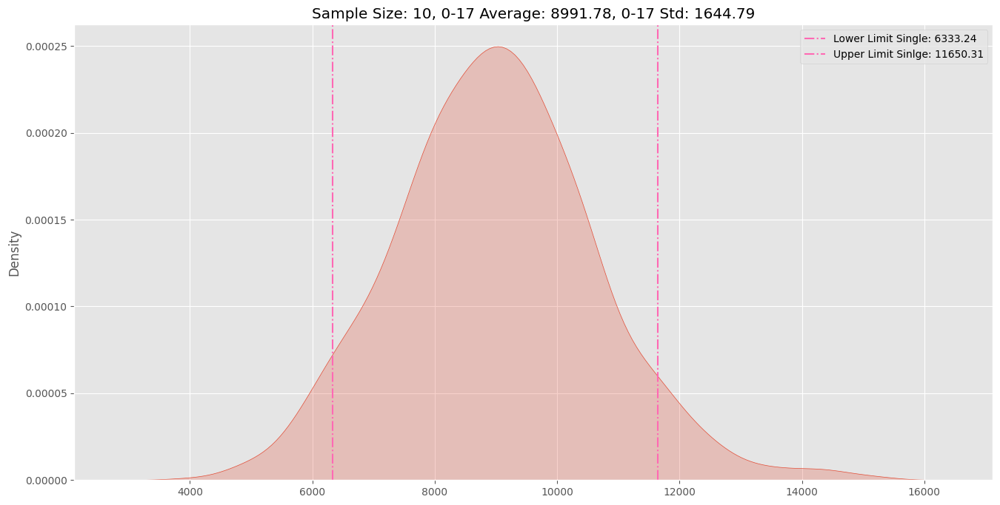

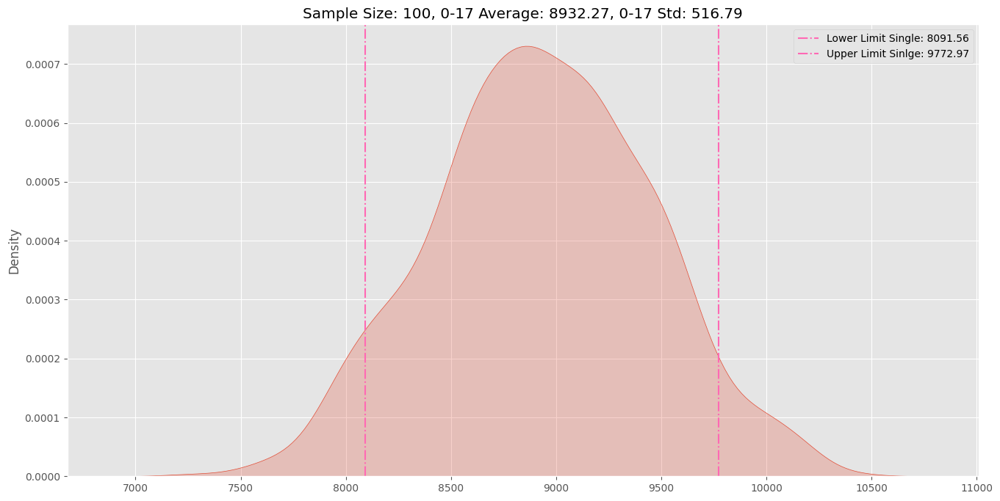

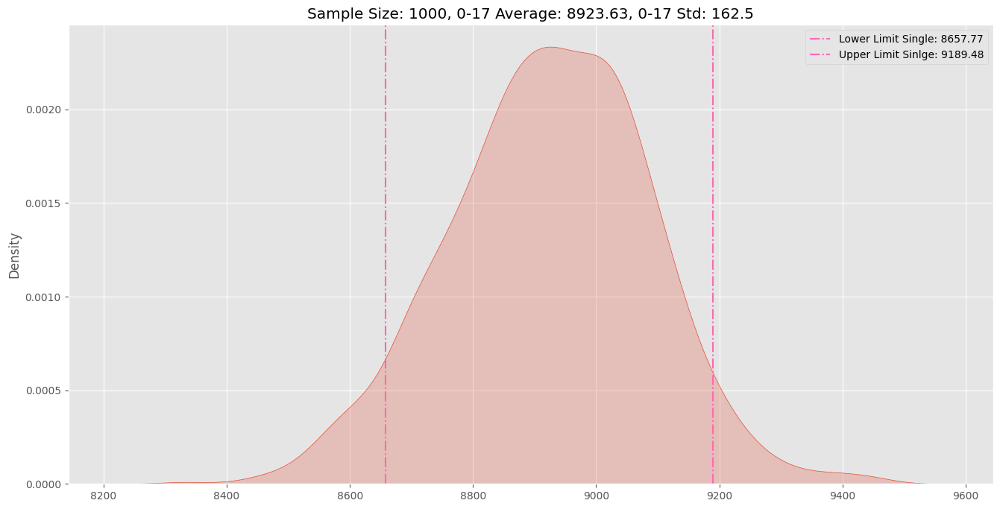

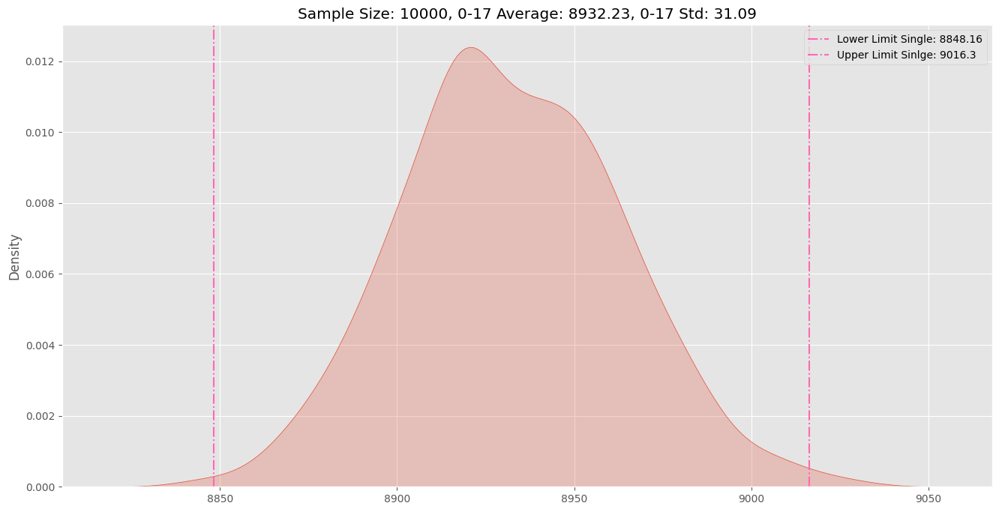

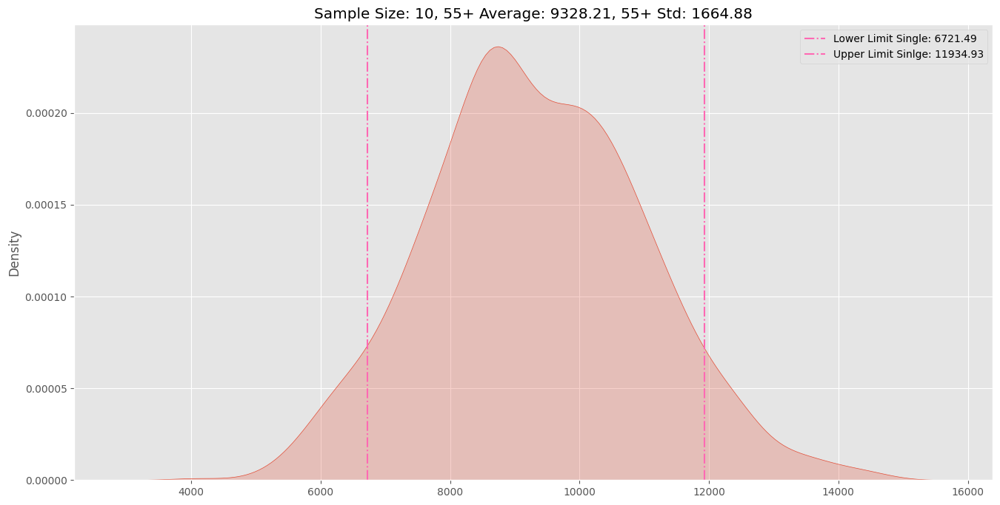

...

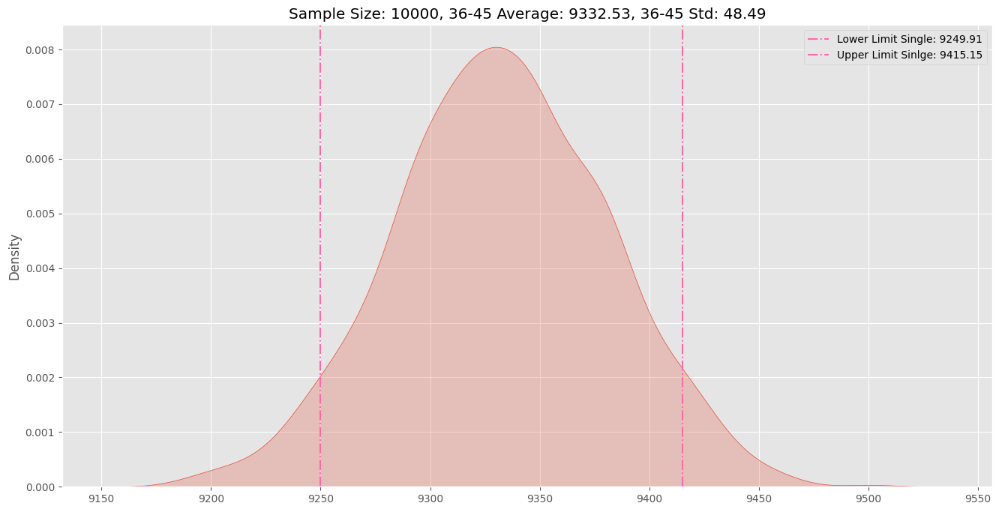

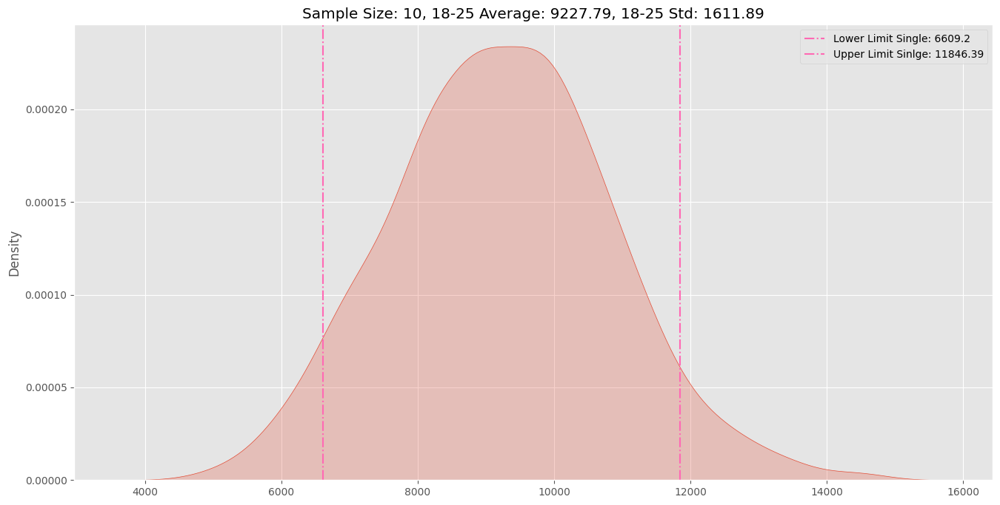

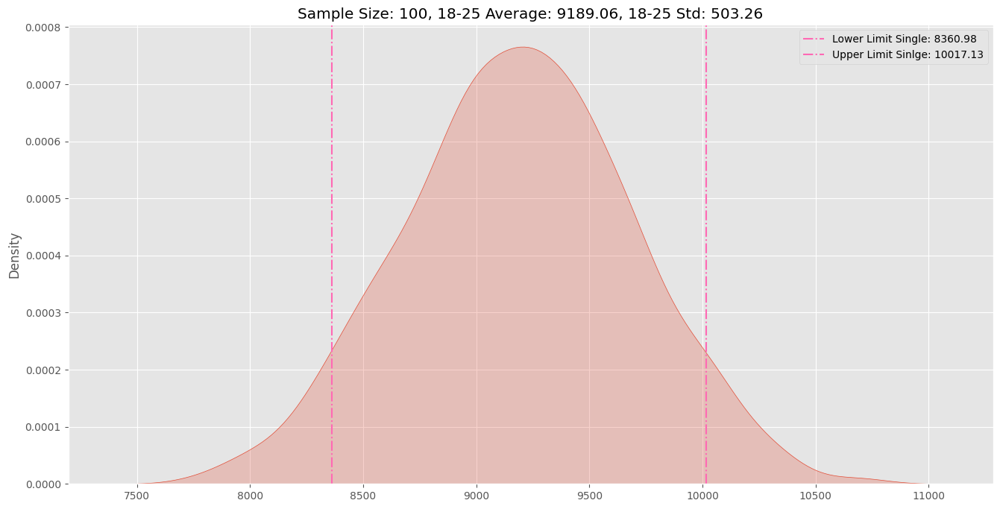

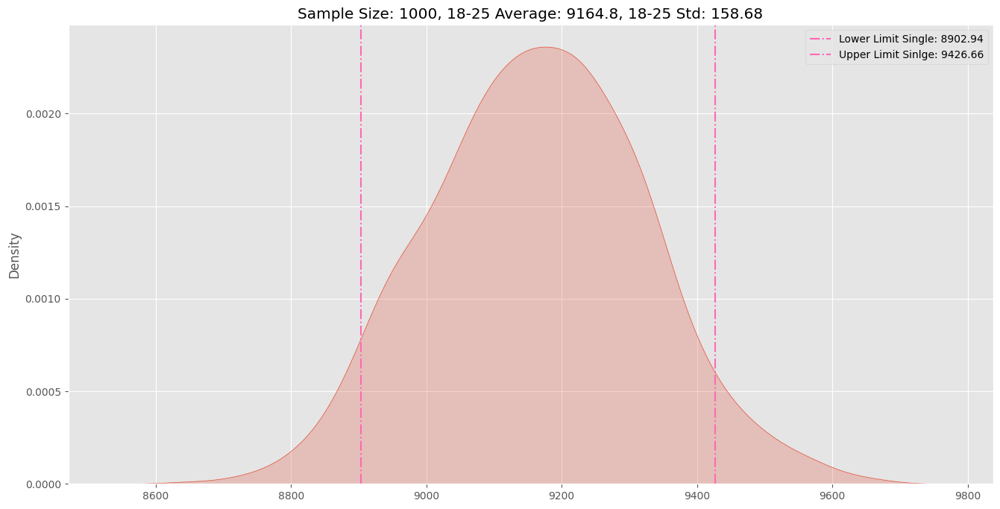

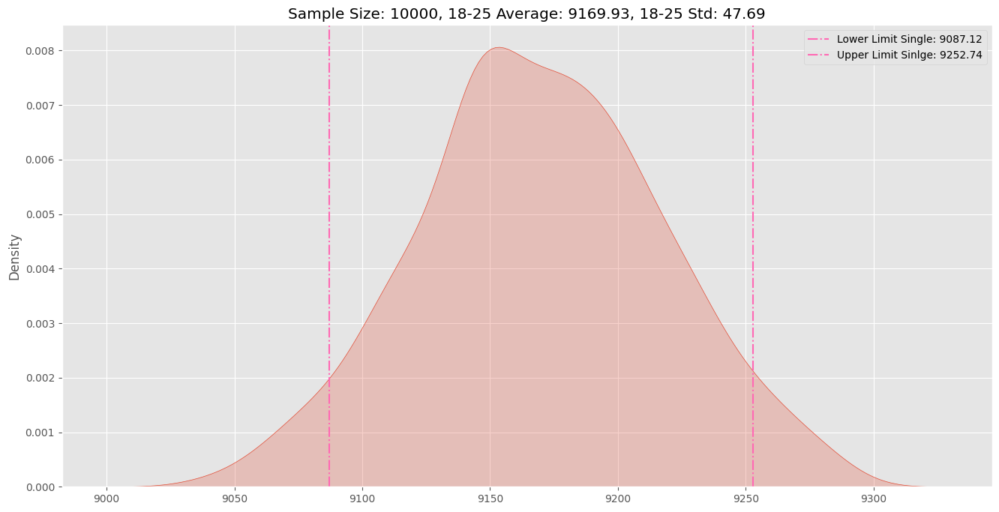

In [125]:
# Plotting the mean of 1000 Random Samples of sizes 10,100,1000 and 10000 with 90% Confidence Interval

sample_sizes = [10,100,1000,10_000]
age_groups = data['Age'].unique().to_list()
df_purchase_age = pd.DataFrame()
for age_group in age_groups:
  for sample_size in sample_sizes:
    df_purchase_age = pd.concat([df_purchase_age,ci_for_purchase_age(data, sample_size, age_group,90)], axis = 0)

In [126]:
df_purchase_age

,Age,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,confidence
0,0-17,10,6333.24,11650.31,8991.78,1616.276177,90.0
0,0-17,100,8091.56,9772.97,8932.27,511.111405,90.0
0,0-17,1000,8657.77,9189.48,8923.63,161.627618,90.0
0,0-17,10000,8848.16,9016.30,8932.23,51.111140,90.0
0,55+,10,6721.49,11934.93,9328.21,1584.773551,90.0
0,55+,100,8504.38,10153.02,9328.70,501.149400,90.0
0,55+,1000,9080.84,9602.18,9341.51,158.477355,90.0
0,55+,10000,9254.02,9418.88,9336.45,50.114940,90.0
0,26-35,10,6692.56,11905.00,9298.78,1584.467856,90.0
0,26-35,100,8420.11,10068.42,9244.27,501.052730,90.0


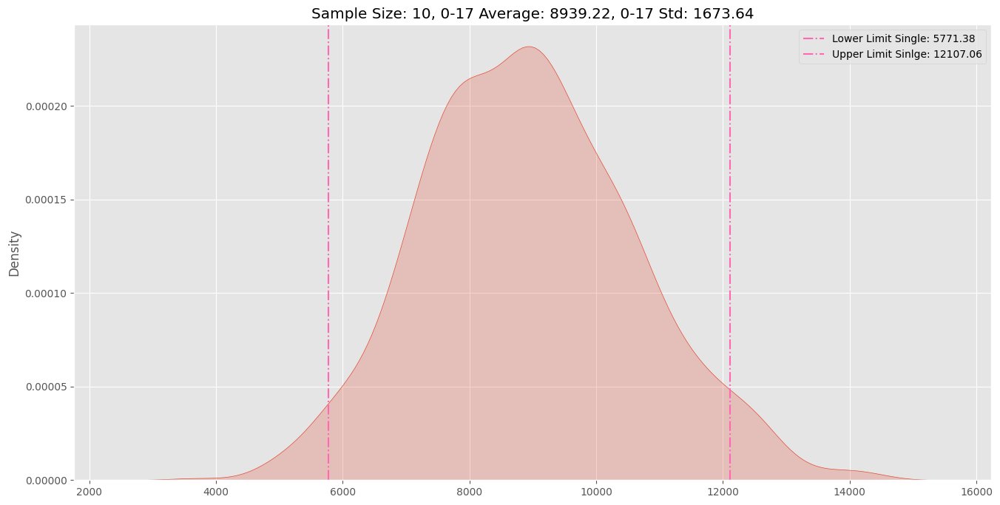

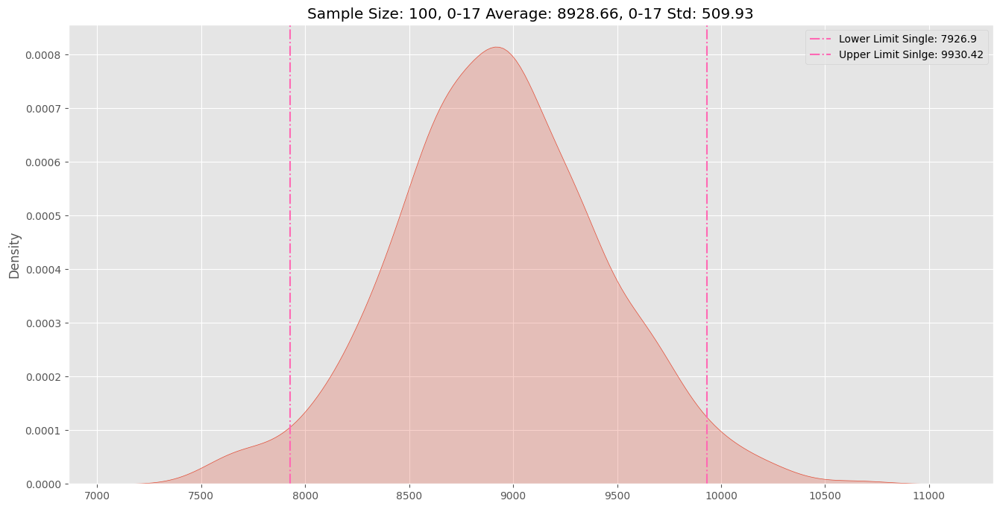

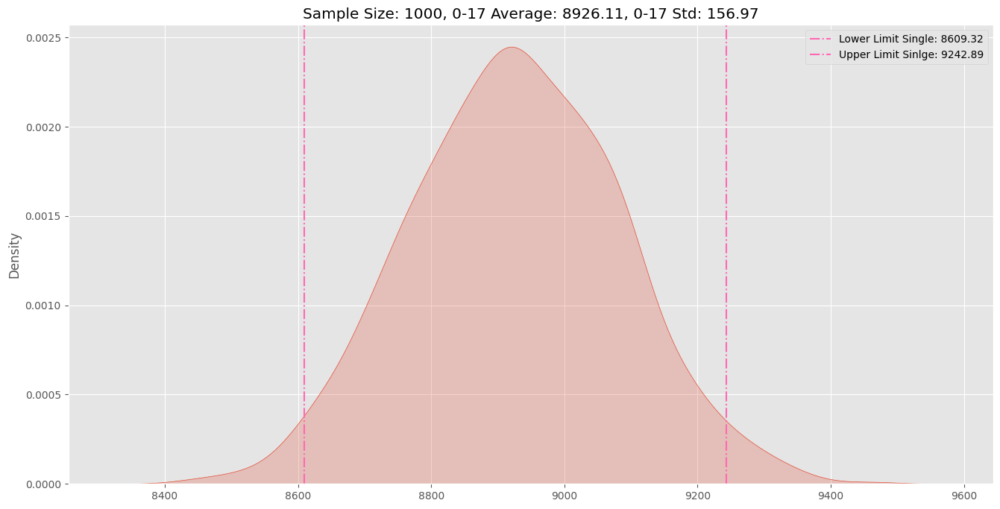

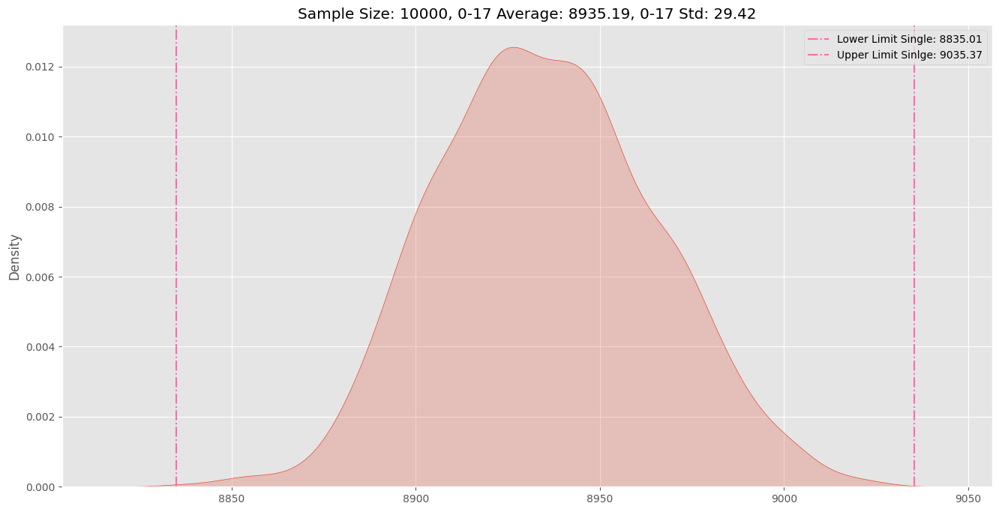

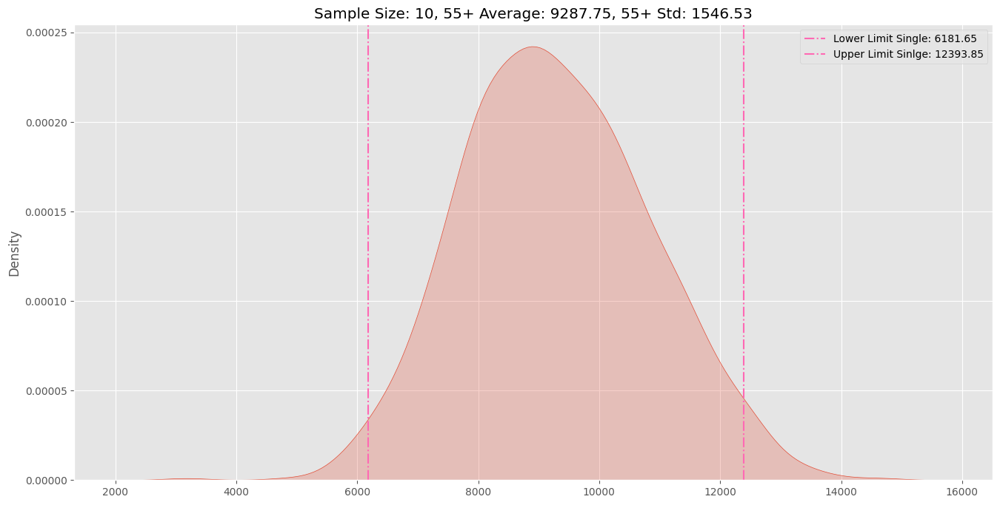

...

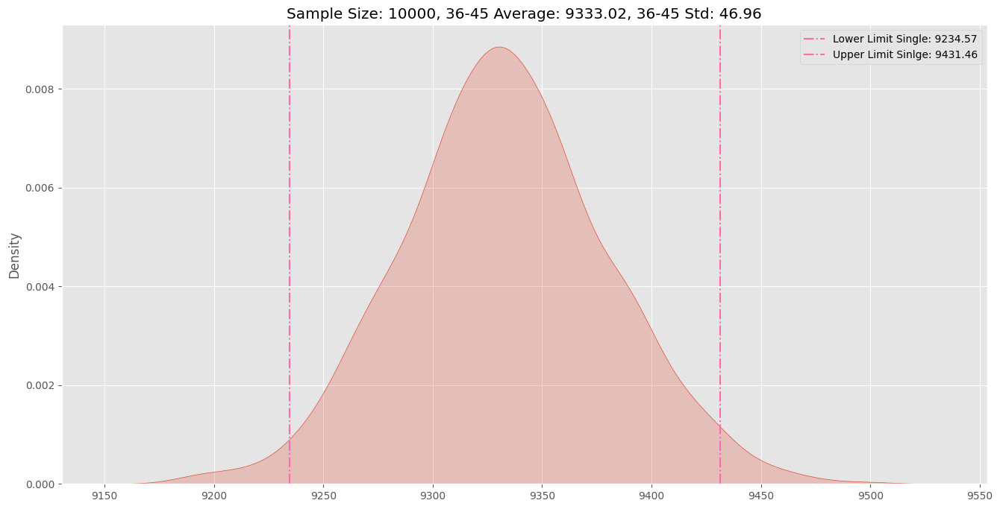

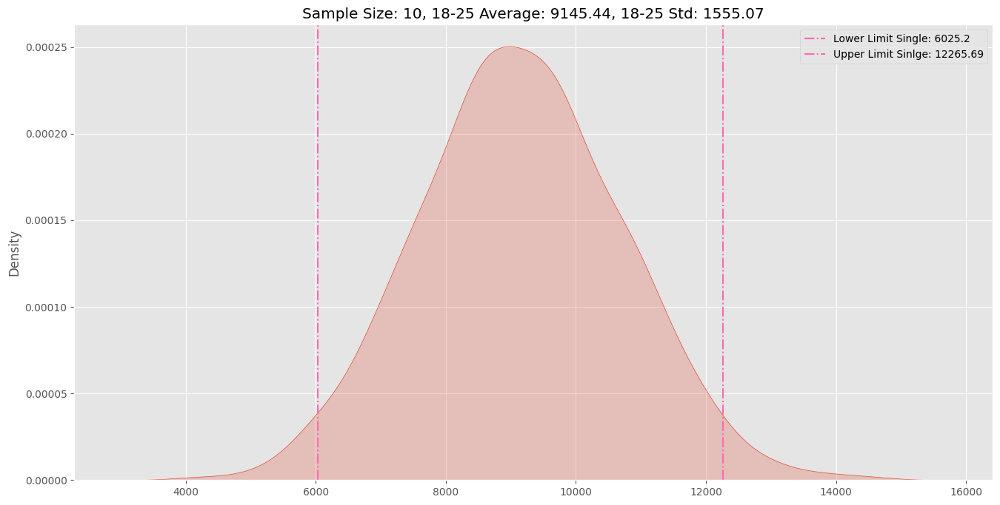

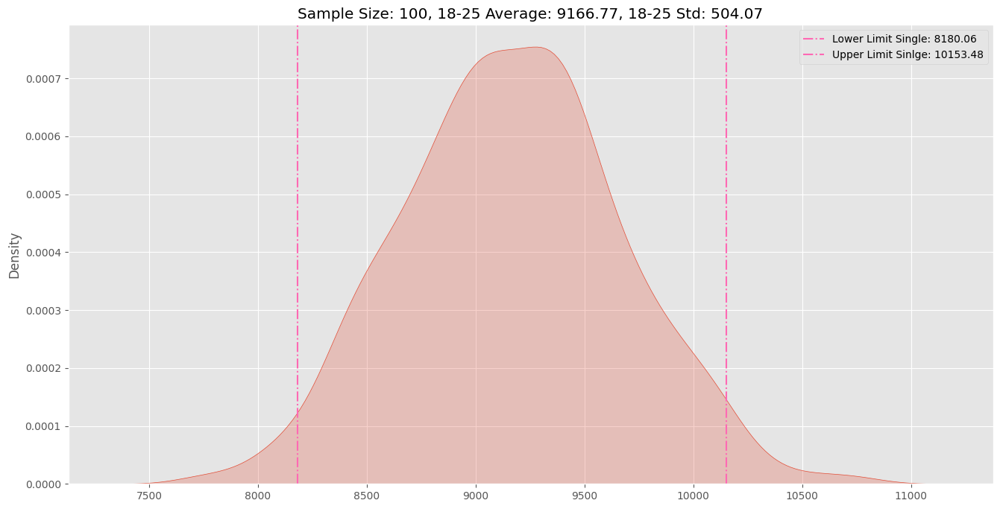

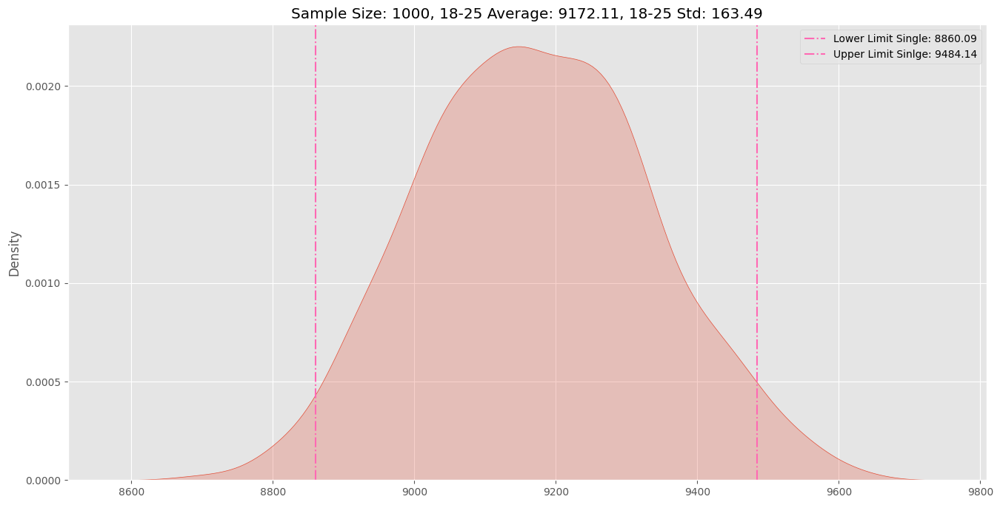

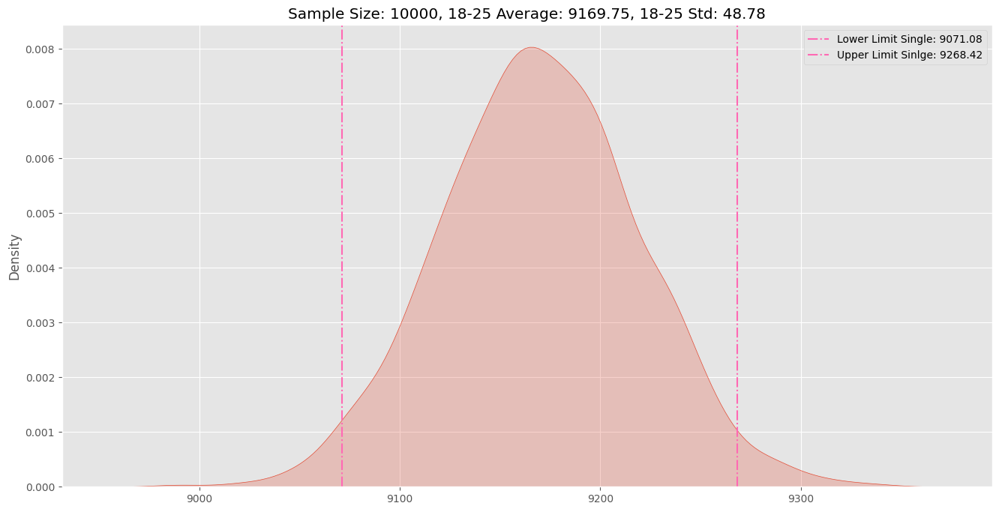

In [127]:
# Plotting the mean of 1000 Random Samples of sizes 10,100,1000 and 10000 with 95% Confidence Interval

sample_sizes = [10,100,1000,10_000]
age_groups = data['Age'].unique().to_list()
for age_group in age_groups:
  for sample_size in sample_sizes:
    df_purchase_age = pd.concat([df_purchase_age,ci_for_purchase_age(data, sample_size, age_group,95)], axis = 0)

In [128]:
df_purchase_age

,Age,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,confidence
0,0-17,10,6333.24,11650.31,8991.78,1616.276177,90.0
0,0-17,100,8091.56,9772.97,8932.27,511.111405,90.0
0,0-17,1000,8657.77,9189.48,8923.63,161.627618,90.0
0,0-17,10000,8848.16,9016.30,8932.23,51.111140,90.0
0,55+,10,6721.49,11934.93,9328.21,1584.773551,90.0
0,55+,100,8504.38,10153.02,9328.70,501.149400,90.0
0,55+,1000,9080.84,9602.18,9341.51,158.477355,90.0
0,55+,10000,9254.02,9418.88,9336.45,50.114940,90.0
0,26-35,10,6692.56,11905.00,9298.78,1584.467856,90.0
0,26-35,100,8420.11,10068.42,9244.27,501.052730,90.0


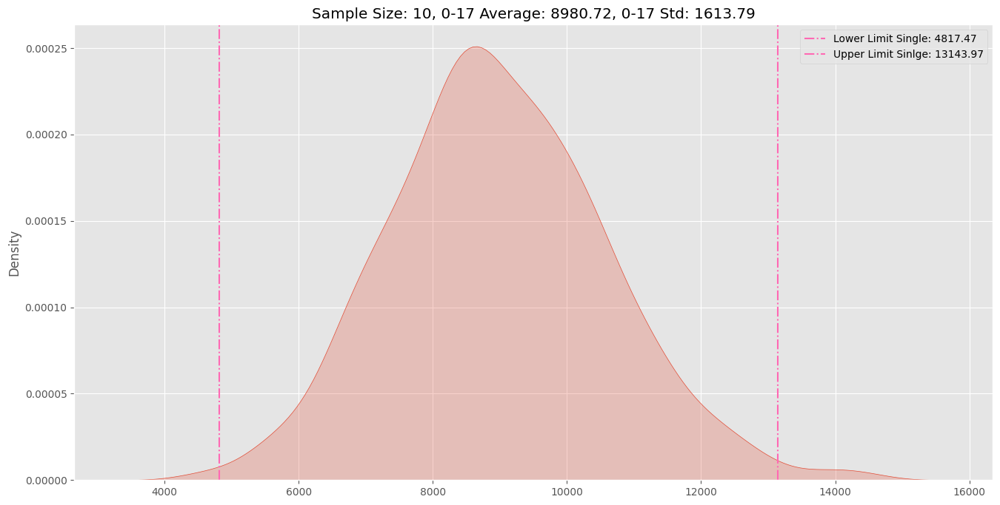

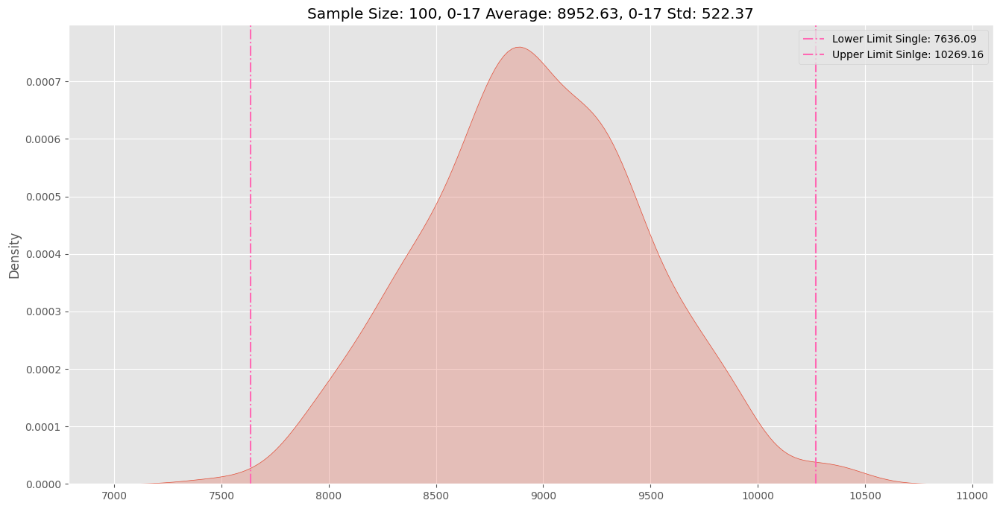

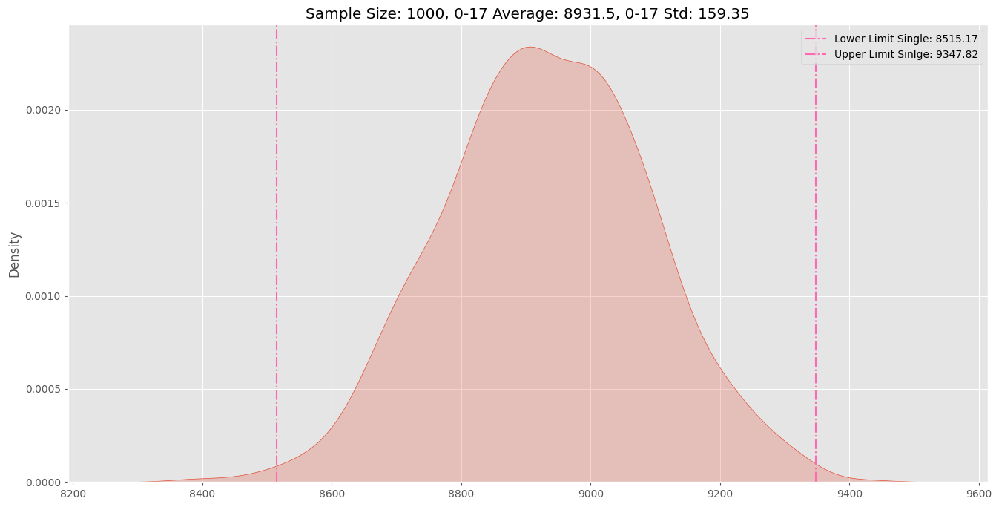

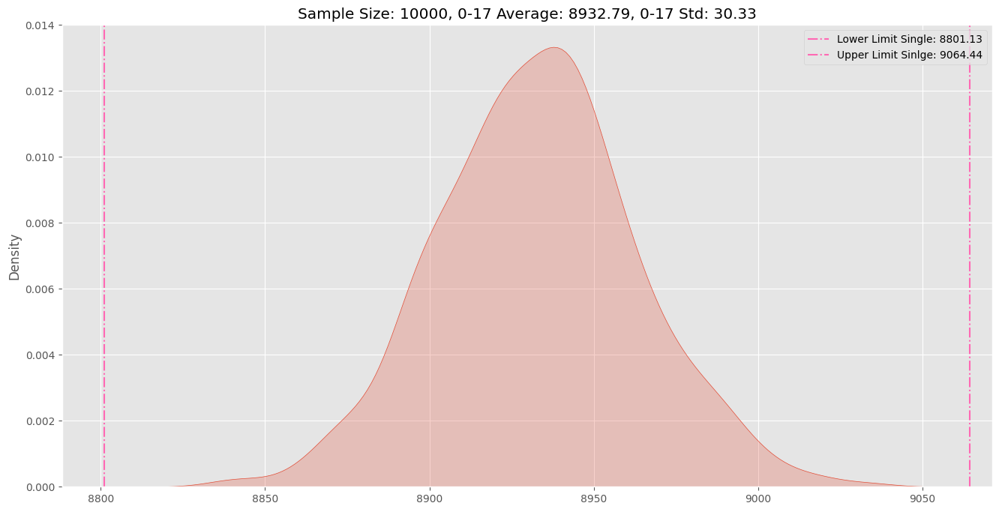

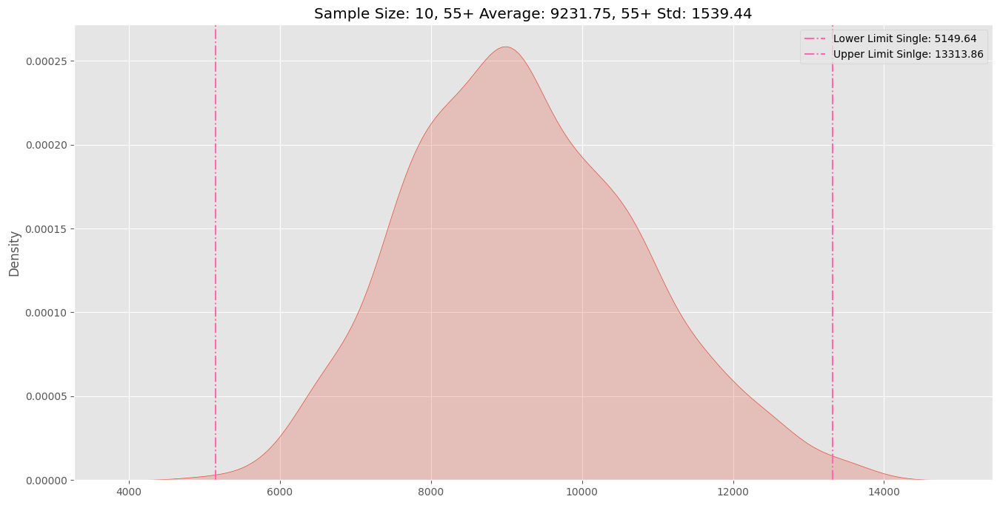

...

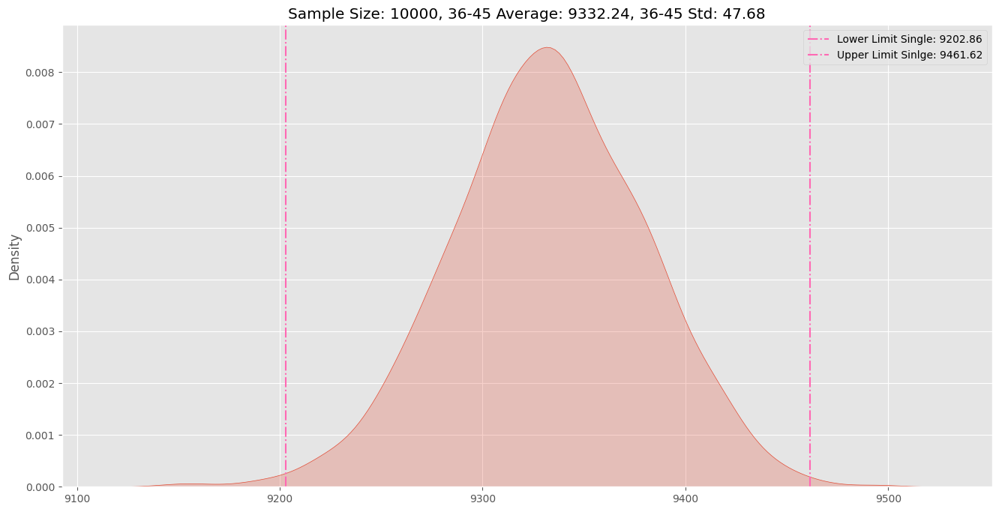

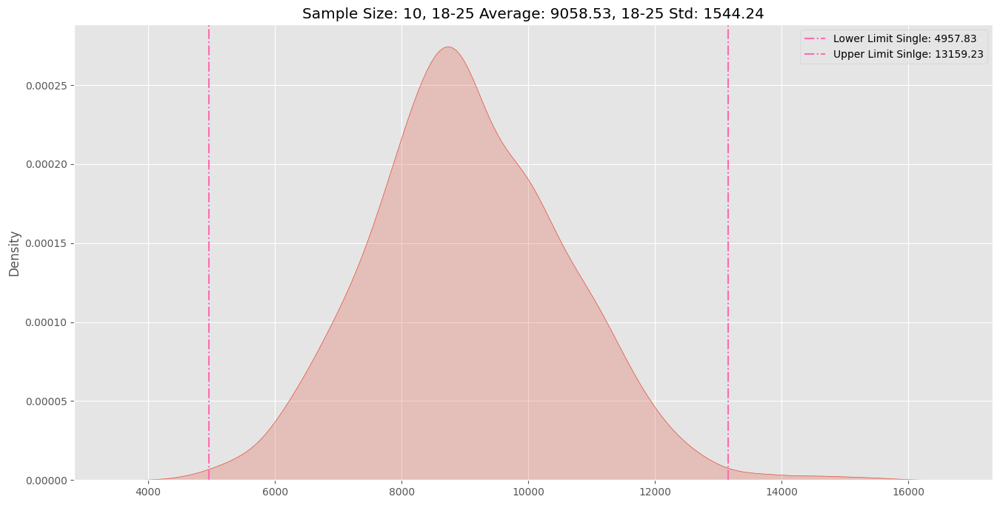

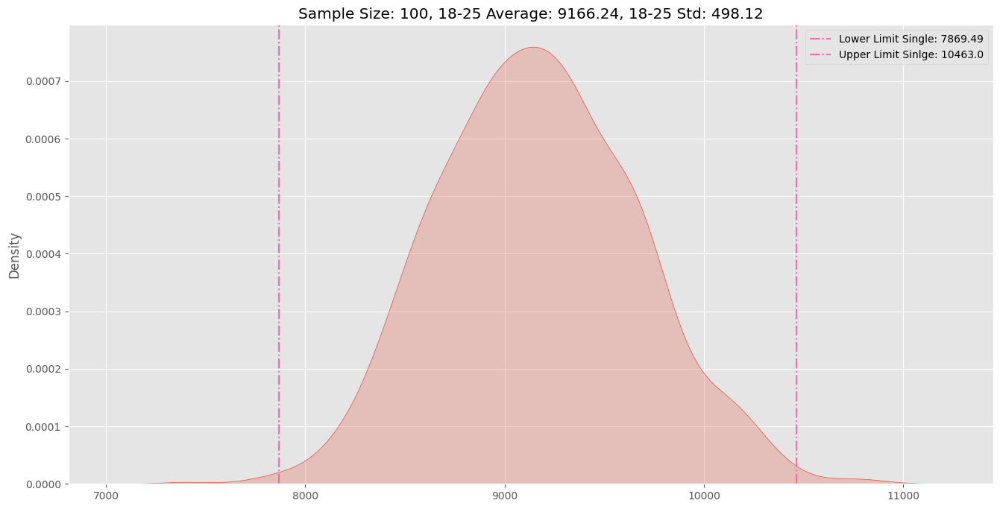

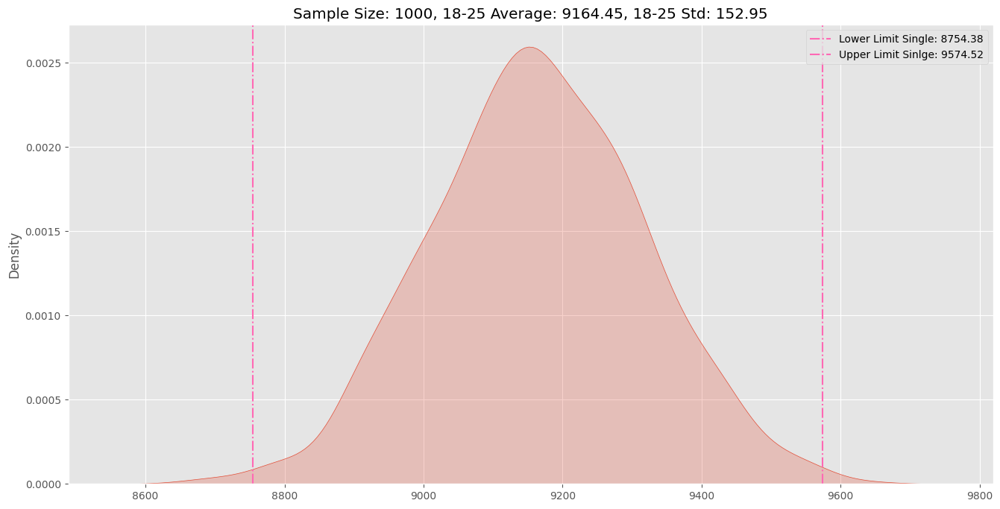

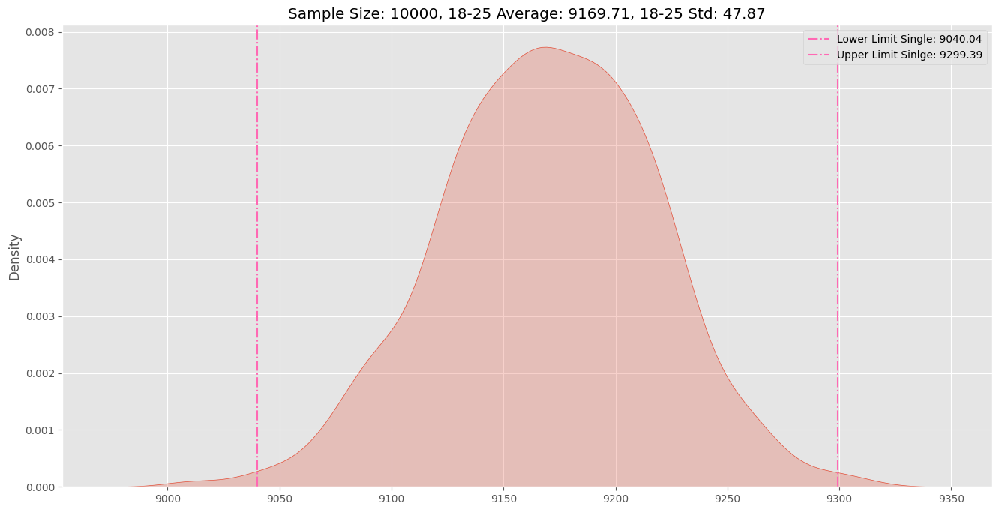

In [129]:
# Plotting the mean of 1000 Random Samples of sizes 10,100,1000 and 10000 with 99% Confidence Interval
sample_sizes = [10,100,1000,10_000]
age_groups = data['Age'].unique().to_list()
for age_group in age_groups:
  for sample_size in sample_sizes:
    df_purchase_age = pd.concat([df_purchase_age,ci_for_purchase_age(data, sample_size, age_group,99)], axis = 0)

In [130]:
df_purchase_age


,Age,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,confidence
0,0-17,10,6333.24,11650.31,8991.78,1616.276177,90.0
0,0-17,100,8091.56,9772.97,8932.27,511.111405,90.0
0,0-17,1000,8657.77,9189.48,8923.63,161.627618,90.0
0,0-17,10000,8848.16,9016.30,8932.23,51.111140,90.0
0,55+,10,6721.49,11934.93,9328.21,1584.773551,90.0
...,...,...,...,...,...,...,...
0,36-45,10000,9202.86,9461.62,9332.24,50.229239,99.0
0,18-25,10,4957.83,13159.23,9058.53,1591.992399,99.0
0,18-25,100,7869.49,10463.00,9166.24,503.432200,99.0
0,18-25,1000,8754.38,9574.52,9164.45,159.199240,99.0


In [131]:
df_purchase_age = df_purchase_age.reset_index(drop = "index")
df_purchase_age['Interval Range'] = df_purchase_age['Upper Limit'] - df_purchase_age['Lower Limit']
df_purchase_age

,Age,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,confidence,Interval Range
0,0-17,10,6333.24,11650.31,8991.78,1616.276177,90.0,5317.07
1,0-17,100,8091.56,9772.97,8932.27,511.111405,90.0,1681.41
2,0-17,1000,8657.77,9189.48,8923.63,161.627618,90.0,531.71
3,0-17,10000,8848.16,9016.30,8932.23,51.111140,90.0,168.14
4,55+,10,6721.49,11934.93,9328.21,1584.773551,90.0,5213.44
...,...,...,...,...,...,...,...,...
79,36-45,10000,9202.86,9461.62,9332.24,50.229239,99.0,258.76
80,18-25,10,4957.83,13159.23,9058.53,1591.992399,99.0,8201.40
81,18-25,100,7869.49,10463.00,9166.24,503.432200,99.0,2593.51
82,18-25,1000,8754.38,9574.52,9164.45,159.199240,99.0,820.14


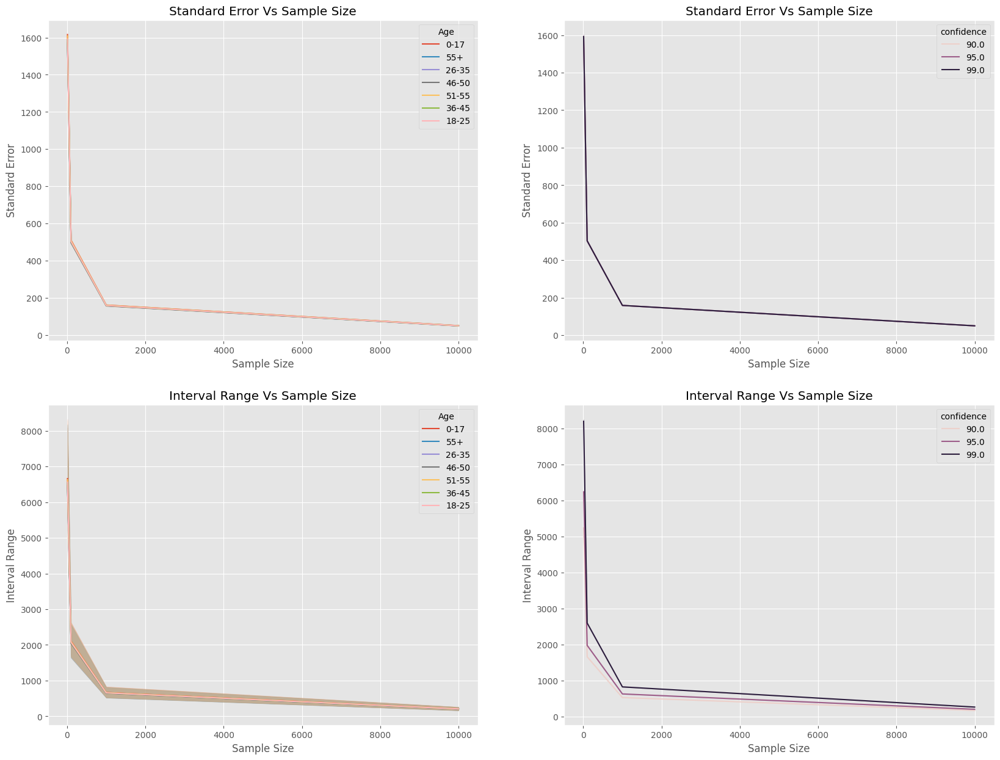

In [132]:
# variation of standard error and interval range with increase in sample size (across Age and Confidence)

plt.figure(figsize = (20,15))
plt.subplot(2,2,1)
plt.title("Standard Error Vs Sample Size")
sns.lineplot(data = df_purchase_age, x= 'Sample Size', y= 'Standard Error', hue= "Age")

plt.subplot(2,2,2)
plt.title("Standard Error Vs Sample Size")
sns.lineplot(data = df_purchase_age, x= 'Sample Size', y= 'Standard Error', hue= "confidence")


plt.subplot(2,2,3)
plt.title("Interval Range Vs Sample Size")
sns.lineplot(data = df_purchase_age, x= 'Sample Size', y= 'Interval Range', hue= "Age")

plt.subplot(2,2,4)
plt.title("Interval Range Vs Sample Size")
sns.lineplot(data = df_purchase_age, x= 'Sample Size', y= 'Interval Range', hue= "confidence")

plt.show()

In [137]:
df_purchase_age[df_purchase_age['confidence'] == 90].sort_values(['Sample Size'])

,Age,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,confidence,Interval Range
0,0-17,10,6333.24,11650.31,8991.78,1616.276177,90.0,5317.07
24,18-25,10,6609.20,11846.39,9227.79,1591.992399,90.0,5237.19
4,55+,10,6721.49,11934.93,9328.21,1584.773551,90.0,5213.44
20,36-45,10,6757.91,11983.24,9370.57,1588.387997,90.0,5225.33
16,51-55,10,6883.40,12175.78,9529.59,1608.767043,90.0,5292.38
8,26-35,10,6692.56,11905.00,9298.78,1584.467856,90.0,5212.44
12,46-50,10,6577.73,11745.11,9161.42,1570.771735,90.0,5167.38
25,18-25,100,8360.98,10017.13,9189.06,503.432200,90.0,1656.15
21,36-45,100,8494.93,10147.33,9321.13,502.292388,90.0,1652.40
17,51-55,100,8704.70,10378.30,9541.50,508.736808,90.0,1673.60


In [138]:
df_purchase_age[df_purchase_age['confidence'] == 95].sort_values(['Sample Size'])

,Age,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,confidence,Interval Range
28,0-17,10,5771.38,12107.06,8939.22,1616.276177,95.0,6335.68
52,18-25,10,6025.20,12265.69,9145.44,1591.992399,95.0,6240.49
32,55+,10,6181.65,12393.85,9287.75,1584.773551,95.0,6212.20
48,36-45,10,6226.78,12453.15,9339.96,1588.387997,95.0,6226.37
44,51-55,10,6342.73,12648.98,9495.86,1608.767043,95.0,6306.25
36,26-35,10,6111.67,12322.67,9217.17,1584.467856,95.0,6211.00
40,46-50,10,6130.20,12287.52,9208.86,1570.771735,95.0,6157.32
53,18-25,100,8180.06,10153.48,9166.77,503.432200,95.0,1973.42
49,36-45,100,8342.12,10311.07,9326.60,502.292388,95.0,1968.95
45,51-55,100,8545.31,10539.52,9542.41,508.736808,95.0,1994.21


In [136]:
df_purchase_age[df_purchase_age['confidence'] == 99].sort_values(['Sample Size'])

,Age,Sample Size,Lower Limit,Upper Limit,Sample Mean,Standard Error,confidence,Interval Range
56,0-17,10,4817.47,13143.97,8980.72,1616.276177,99.0,8326.50
80,18-25,10,4957.83,13159.23,9058.53,1591.992399,99.0,8201.40
60,55+,10,5149.64,13313.86,9231.75,1584.773551,99.0,8164.22
76,36-45,10,5213.59,13396.43,9305.01,1588.387997,99.0,8182.84
72,51-55,10,5416.36,13704.17,9560.27,1608.767043,99.0,8287.81
64,26-35,10,5149.82,13312.45,9231.13,1584.467856,99.0,8162.63
68,46-50,10,5185.44,13277.52,9231.48,1570.771735,99.0,8092.08
81,18-25,100,7869.49,10463.00,9166.24,503.432200,99.0,2593.51
77,36-45,100,8024.93,10612.57,9318.75,502.292388,99.0,2587.64
73,51-55,100,8214.38,10835.22,9524.80,508.736808,99.0,2620.84


As the sample sizes are increasing we see that:
- Interval Ranges are decreasing
- Standard Error is decreasing

Also it is observed that for each conficence interval irrespective of the sample sizes the Confidence Interval Ranges are overlapping

- `We can say that age group does not have much effect on the spending of customers as their interval range is overalpping`

## Insights
- Nearly 78% customers are from 18-35 years of age with ~40% transactions made by people from 26-35 years of age
- Nearly 3 out of 4 transactions are made by male customers
- ~ 80% of revenue is generated from below product categories
  - 1, 5, 8 and 6
- City C has the hihghest number of unique users at 53.28% whereas majority of revenue is coming from city B which is ~42%
- 50% of the purchases made are between amount range 5900 - 12000
- Females in city category C are purchasing more than females in city category A and B
- From the analysis of confidence intervals it can be inferred that Gender affects purchase behaviour


## Recommendations
- Revenue from Single custotmers is higher than married. Hence more focus can should be given to accuire more single customers.
- We see that overall females are spending lesser than males. They should be given additional offers to increase their numbers.
- Since young customers from 18-35 are generating huge revenue, focus should be to accuire more young customers.
- 1, 5, 8 and 6 product categories should be made more available as they are generating 80% of revenue of all the available product categories.
- Male Customers in City category C are purchasing more than males in city category A and B. Hence more sales can be made in City C to increase revenue.
